# Project 4: Impact of Synthetic Data on Classifier Performance
- 2024.03.03
- Wayne Mitchell

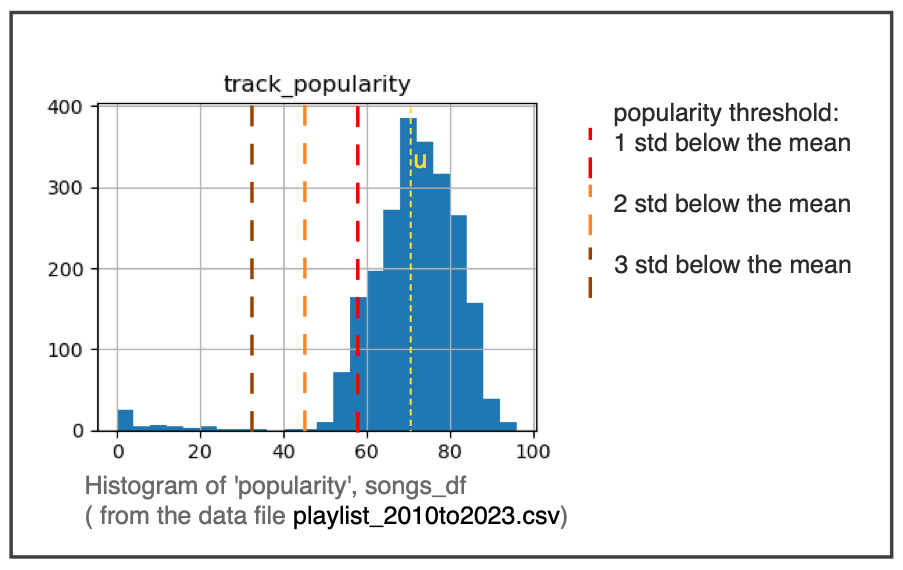

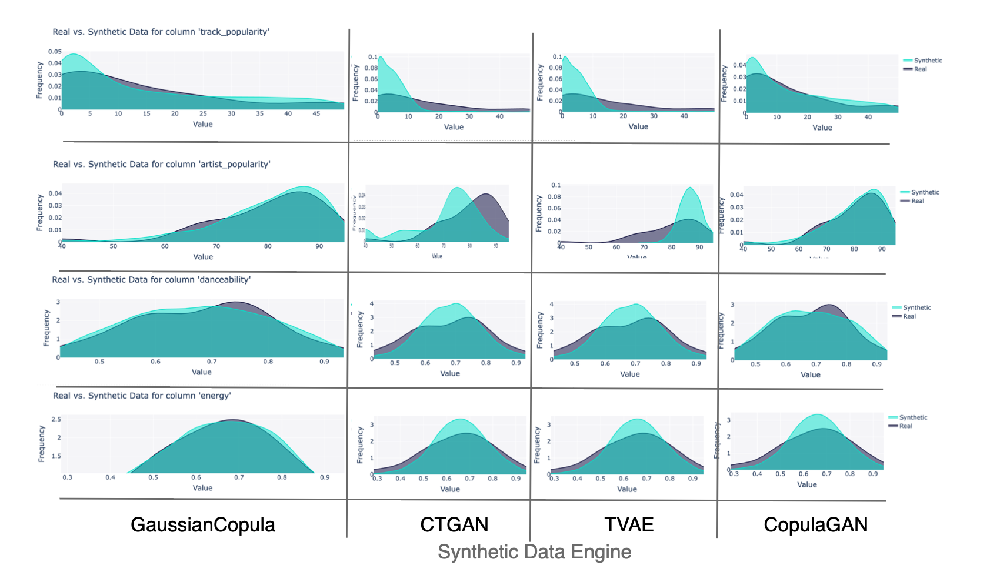

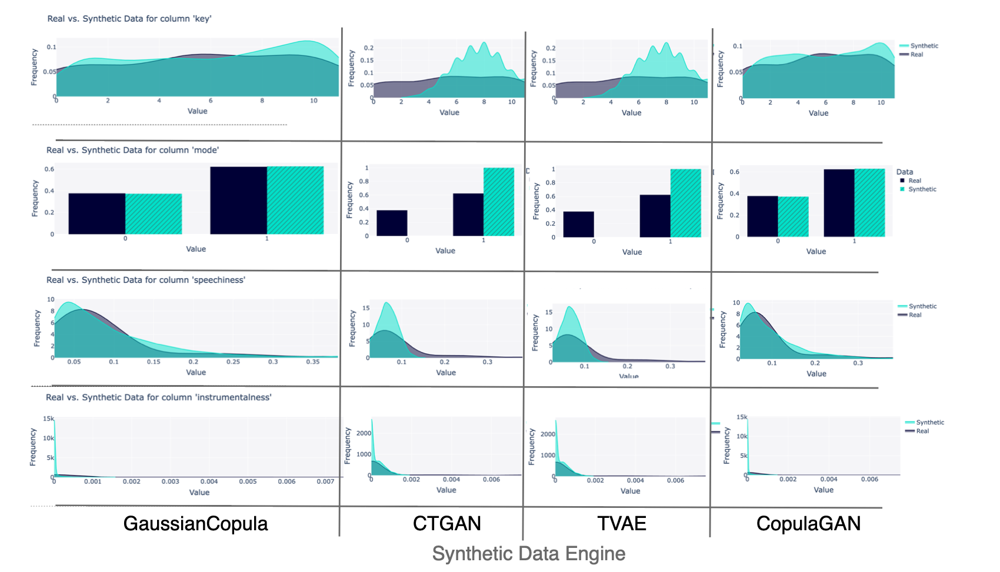

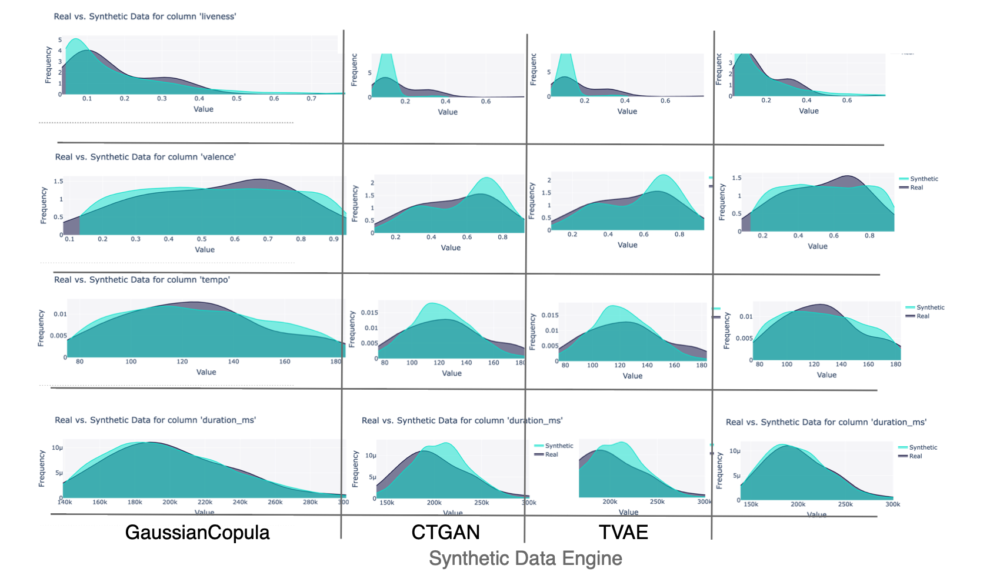

## Import modules

In [2030]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
import os
import inspect
import sdv
from sdv.metadata import Metadata
from sdv.single_table import GaussianCopulaSynthesizer
from sdv.single_table import CTGANSynthesizer
from sdv.single_table import TVAESynthesizer
from sdv.single_table import CopulaGANSynthesizer
from sdv.evaluation.single_table import evaluate_quality
from sdv.evaluation.single_table import get_column_plot
import re
import math
import inspect

### NOTES:
- observed that the synthetic data synthesizers did not handle the<br>
one-hot refactoring of 'genres': all values the one-hot category columns <br>
are set to  zero in the synthetic data.<br>
This is probably because a single positive value in one cell of a long column of zeros<br>
is so infrequent that the 'one' also looks like a 'zero', statistically speaking. Work arround: <br>
first altered the genre cateories from embedded lists to concatenated stings; then,<br>
generated synthetic data useing genre categories; then combined with real data;<br>
then 'deconcatenated' to restore original format; then split sub-lists<br>
and only then did one-hot encoding<br>


## Functions:
1. calculate unpopularity threshold(df, method)
2. transform_neg_column_values_to_pos(df, column_names)
3. get_var_name(var)
4. test_lists_for_identity(list_of_lists)
5. make_backup_dict_of_columns(df, key_column, value_column)
6. remove_nulls_if_less_than_threshhold(df, percent)
7. count_duplicates()
8. remove_duplicates(df, columns_to_check):
9. convert_column_to_index(df, column_to_convert)
10. remove_columns(df, columns_to_remove):
11. change_sublist_to_concatenated_string(df, new_col_name)
12. one_hot_encode_genres(df, target_column, genre_retain_threshold)
13. create_and_save_metadata(unpopular_songs_df, file_path, tablename)
14. create_synthetic_data(df, metadata, synthesizer_engine, target_sample_number)
15. save_synthetic_data_to_file(data, filepath)
16. check_real_versus_synthetic_column_names(real_df, syth_df)
17. plot_real_versus_synth_data(column_name, real_data_df, synth_data_df, metadata)
18. add_column_to_dataframe_and_fill_with_a_value(df, column_name, value)
19. stack_merge_dataframes(df_list)
20. unconcatenate_dataframe_column(df)
21. make_and_run_RandomForestModel(merged_restored_df, y_column_name, random_state, n_estimators)
22. adjust_popularity_class(df, target_colum, new_threshold)
23. balance_with_synthetic_data(target_df, synth_df, target_column)

In [2033]:
# Function 1
def calculate_unpopularity_threshold(df, method):
    df_stats = df.describe()
    if method == 'three_std':
        mean = df_stats.at['mean','track_popularity']
        std = df_stats.at['std','track_popularity']
        threshold = mean - (3 * std)
        threshold = int(math.ceil(threshold))
        return threshold
    elif method == 'lower_quartile':
        threshold = df_stats.at['25%','track_popularity']
        threshold = int(math.ceil(threshold))
        return threshold

In [2034]:
# Function 2
def transform_neg_column_values_to_pos(df, column_names):
    for col_name in column_names:
        print(col_name)
        max_col_value = max(df[col_name])
        min_col_value = min(df[col_name])
        delta = max_col_value - min_col_value
        new_col_name = 'transformed_' + col_name 
        df[new_col_name] = df[col_name].transform(lambda x: x + delta)
        df = df.drop(columns=[col_name])
    return df

In [2035]:
# Function 3
def get_var_name(var):
    current_frame = inspect.currentframe()
    caller_frame = inspect.getouterframes(current_frame)[1]
    local_vars = caller_frame.frame.f_locals

    for name, value in local_vars.items():
        if value is var:
            return name

In [2036]:
# Function 4
def test_lists_for_identity(list_of_lists):
    
    list_report_dict={}
    
    list_length = (len(list_of_lists))-1
    for i in range(list_length):
        for j in range(list_length):
            if (i < j):
                this_key = 'list_' + str(i) + '_to_' + 'list_' + str(j) 
                if list_of_lists[i] == list_of_lists[j]:
                    list_report_dict.update({this_key: 'equivilent'})
                else:
                    list_report_dict.update({this_key: 'NOT equivilent'})

    return list_report_dict

In [2037]:
# Function 5
def make_backup_dict_of_columns(df, key_column, value_column):
    keys = list(df[key_column])
    values = list(df[value_column])
    zipper = zip(keys, values)
    this_dict = dict(zipper)
    return this_dict

In [2038]:
# Function 6
def remove_nulls_if_less_than_threshhold(df, threshold):
    # count nulls
    null_count = df.isnull().sum()

    #count rows
    row_count = df.shape[0]

    if null_count <= threshold * row_count:
        #remove rows with null
        df.dropna(inplace=True)
        return df
    else:
        return False

In [2039]:
# Function 7
def count_duplicates_in_column(df, column):
    # Count occurrences of each value in the column
    value_counts = df[column].value_counts()

    # Identify and count duplicates
    duplicates = value_counts[value_counts > 1]
    num_duplicates = duplicates.sum() - len(duplicates)

    return num_duplicates

In [2040]:
# Function 8
def remove_duplicates(df, column_to_check):
    # keep the first occurance
    df = df.drop_duplicates(subset=[column_to_check], keep='first')
    return df

In [2041]:
# Function 9
def remove_columns(df, columns_to_remove):
    df = df.drop(columns=columns_to_remove)
    return df

In [2042]:
# Function 10
def convert_column_to_index(df, column_to_convert):
    df.set_index(column_to_convert, inplace=True)
    return df

In [2043]:
# Function 11
def convert_index_to_column(df, new_column_name):
    df = df.reset_index().rename(columns={'index': new_column_name})
    return df

In [2044]:
# Function 12
def change_sublist_to_concatenated_string(df, target_column, new_col):

    pattern = r"[\'\(\)\[\]\{\}]"
    pattern_2 = r", "
    pattern_3 = r" "
    errors = []
    i = 0
    for sublist in df[target_column]:
        sublist = re.sub(pattern,"",sublist)
        sublist = sublist.strip()
        sublist = re.sub(pattern_2,"_",sublist)
        sublist = re.sub(pattern_3,"+",sublist)
        df.at[i,new_col] = sublist
        if  ( re.findall(pattern_3, sublist) or re.findall(pattern_2, sublist)  ):
            errors.append(sublist)
        i+=1
 
    # remove old column
    df = df.drop(columns=[target_column])
    if len(errors) == 0:
        return df
    else:
        return False

In [2045]:
# Function 13
def one_hot_encode_genres(df, target_column, genre_retain_threshold):

    # get row count
    row_count = df.shape[0]
    print(f"row_count: {row_count}")
    # fill empty cells to force 'other' assignment
    df[target_column]= df[target_column].fillna('X')

    # explode sublists and get list of unique genres
    all_genres_list = []
    pattern = r"[\'\(\)\[\]\{\}]"
    pattern_2=r" "
    for genre_sublist in df[target_column]:
        for genre in genre_sublist: 
            genre = re.sub(pattern_2,"_",genre)
            all_genres_list.append(genre)

    print(f"all_genres_list: {len(all_genres_list)}")
    print(all_genres_list[0:5])
    #['hip_hop', 'rap', 'alt_z',
    
    # get genre list for frequency at least equal to threshold
    ## make a genres_df from list of all genres
    ## use value_counts to get count of uniques
    genres_df = pd.DataFrame(all_genres_list, columns=['all_genres'])
    genre_counts = genres_df['all_genres'].value_counts(sort=True)
    unique_genre_keepers = []
    for index, value in genre_counts.items():
        if value >= genre_retain_threshold:
            unique_genre_keepers.append(index)

    #print(f"length unique_genre_keepers: {unique_genre_keepers}")
    #print(unique_genre_keepers[0:5])


    # insert columns with concat
    col_names_for_insert = unique_genre_keepers
    col_names_for_insert.append('genre_other')
    
    new_columns_dict = {}
    all_zeros = []
    
    for i in range(len(df)):
        all_zeros.append(0)
        
    for col_name in col_names_for_insert:
        new_columns_dict[col_name] = all_zeros

    new_cols_df = pd.DataFrame(new_columns_dict)
    df = pd.concat([df, new_cols_df], axis=1)
    
    # iterate through 'target column' values/ sublist values (genres);
    # if genre from df row found in unique_genres_keepers, set the
    # corresponding one-hot category cell to '1', otherwise set 'other' cell to '1'
    named_genre = 0
    other_genre = 0
    pattern = r"[\'\(\)\[\]\{\}]"
    pattern_2=r" "
    i = 0
    for genre_sublist in df[target_column]:
        for genre in genre_sublist: 
            genre = re.sub(pattern,"",genre)
            genre = genre.strip()
            genre = re.sub(pattern_2,"_",genre)
            #print(f"genre for test against keepers: {genre}")
            if genre in unique_genre_keepers:
                #print(f"genre for test against keepers: {genre}")
                df.at[i,genre] = 1
                named_genre += 1
        else:
            df.at[i,'genre_other'] = 1
            other_genre += 1
            
        i += 1
  
    # drop target column
    df = df.drop(target_column, axis=1)
    
    return df

In [2046]:
# Function 14
def  create_and_save_metadata(df, this_filepath, this_tablename):
    
    # create metadata
    metadata = Metadata.detect_from_dataframe(
        data=df,
        table_name=this_tablename
    )
    
    # save metadata to json file
    metadata.save_to_json(this_filepath)
    
    return metadata

In [2047]:
# Function 15
def create_synthetic_data(df, metadata, synthesizer_engine, target_sample_number):

    # Create a synthesizer model
    synthesizer_model = synthesizer_engine(metadata)

    # Fit the synthesizer to the real data
    synthesizer_model.fit(df)

    # Generate synthetic data (e.g., 1000 samples)
    synthetic_data_df = synthesizer_model.sample(num_rows=target_sample_number)

    return synthetic_data_df

In [2048]:
# Function 16
def check_real_versus_synthetic_column_names(real_df, syth_df):
   
    # get list of column names from real_data frame
    column_names_real = real_df.columns
    # get list of column names from synthetic data_frame
    column_names_synth = syth_df.columns

    # sort the column name lists
    column_names_real_sorted = sorted(column_names_real)
    column_names_synth_sorted = sorted(column_names_synth)

    if column_names_real_sorted == column_names_synth_sorted:
        return True
    else:
        return False

In [2049]:
# Function 17
def plot_real_versus_synth_data(real_data_df, synth_data_df, metadata):
    # get list of column names from real_data frame
    column_names = real_data_df.columns
    # get list of column names from synthetic data_frame
    fig = get_column_plot(
        real_data=real_data_df,
        synthetic_data=synth_data_df,
        metadata=metadata,
        column_name=column_names
    )
    return fig   

In [2050]:
# Function 18
def add_column_to_dataframe_and_fill_with_a_value(df, column_name, value):
    df[column_name] = [value] * len(df)
    return(df)

In [2051]:
# Function 19
def stack_merge_dataframes(df_list):

    df1 = df_list.pop()
    print(type(df1))
    df2 = df_list.pop()
    print(type(df2))
    df_stacked = pd.concat([df1, df2])

    for i in range(len(df_list)):
        df = df_list[i]
        print(type(df))
        df_stacked = pd.concat([df_stacked, df])

    return df_stacked

In [2052]:
# Function 20
def unconcatenate_dataframe_column(df, column_name, new_column_name):
    
    #get target column as list
    column_list = df[column_name].tolist()

    # iterate through list and split concatented string into tmp_list of strings
    delimiter = " "
    new_col_values = []
    for element in column_list:
        tmp_list = element.split('_')
        temp_new_list = []
        for phrase in tmp_list:
            word_list = phrase.split('+')
            whole_phrase = delimiter.join(word_list)
            temp_new_list.append(whole_phrase)
        
        new_col_values.append(temp_new_list)
        
    # add  new_col_values to new dataframe column
    df[new_column_name] = new_col_values

    # drop concate column
    df = df.drop(columns=column_name)

    return df

In [2053]:
#merged_df.info()
#### merged_restored_df = unconcatenate_dataframe_column(merged_df, 'artist_genres_concat', 'artist_genres') 

In [2054]:
##### merged_restored_df.head()

In [2055]:
# Function 21
def make_and_run_RandomForestModel(df, y_column_name, this_random_state, this_n_estimators):

    result_list = []

    ### MAKE AND RUN MODEL
    # define features set by droping the target data column
    X = df.copy()
    X.drop(y_column_name, axis=1, inplace=True)

    # define target vector from data in the dropped column
    y = df[y_column_name]

    # split data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=this_random_state)
    
    # create scalar instance
    scaler = StandardScaler()

    # fit StandardScalar
    X_scaler = scaler.fit(X_train)

    # scale the data
    X_train_scaled = X_scaler.transform(X_train)
    X_test_scaled = X_scaler.transform(X_test)

    # create a random forest classifier
    rf_model = RandomForestClassifier(n_estimators=this_n_estimators, random_state=this_random_state+1)
    
    # fit the model
    rf_model = rf_model.fit(X_train_scaled, y_train)
    result_list.append(rf_model)
    
    # make prediction
    predictions = rf_model.predict(X_test_scaled)
    result_list.append(predictions)

    ### EVALUATE MODEL
    # calculate confusion matrix
    cm = confusion_matrix(y_test, predictions)
    cm_df = pd.DataFrame(
        cm, index=["Actual 0", "Actual 1"], columns=["Predicted 0", "Predicted 1"]
    )
    result_list.append(cm_df)

    # calculate accÏÏuracy scor4
    acc_score = accuracy_score(y_test, predictions)
    result_list.append(acc_score)
    
    # compile classification report
    class_report = classification_report(y_test, predictions)
    result_list.append(class_report)
    
    return result_list

In [2056]:
def adjust_popularity_class(df, conditional_column, target_column, new_threshold):
    
    working_df = df.copy()
    print(f"lenght target column: {len(working_df[target_column])}")

    working_df.loc[working_df[conditional_column] < new_threshold, target_column] = 0
    working_df.loc[working_df[conditional_column] >= new_threshold, target_column] = 1

    print(f"lenght target column: {len(working_df[target_column])}")
    return working_df

In [2057]:
def balance_with_synthetic_data(target_df, synth_df, target_column):

    target_column = 'popularity_class'
    value_counts = target_df[target_column].value_counts()
    value_0 = value_counts[0]
    value_1 = value_counts[1]
    print(f"v_1: {value_1}, v_0: {value_0}")
    delta = value_1 - value_0

    # get random selection of synthetic data
    random_rows_df = synth_df.sample(n=delta, random_state=42)
    print(type(random_rows_df))

    # stack merge target_df and random_rows_df
    dfs_to_merge=[target_df, random_rows_df]
    merged_df = pd.concat(dfs_to_merge).reset_index(drop=True)
    
    return merged_df

In [2058]:
synthetic_GaussianCopula_df.columns

Index(['artist_popularity', 'danceability', 'energy', 'key', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'duration_ms', 'transformed_loudness', 'popularity_class'],
      dtype='object')

In [2059]:
songs_0_pc_synthetic_pop_eq_mean_no_trackPop_df.columns
songs_0_pc_synthetic_pop_eq_mean_no_trackPop_df.head()

,artist_popularity,danceability,energy,key,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,transformed_loudness,popularity_class,pop,dance_pop,rap,pop_rap,hip_hop,r&b,urban_contemporary,trap,modern_rock,rock,southern_hip_hop,canadian_pop,hip_pop,edm,pop_dance,uk_pop,neo_mellow,gangster_rap,atl_hip_hop,post-grunge,post-teen_pop,alternative_metal,talent_show,pop_rock,dirty_south_rap,permanent_wave,contemporary_r&b,boy_band,urbano_latino,trap_latino,reggaeton,uk_dance,east_coast_hip_hop,neo_soul,nu_metal,melodic_rap,europop,miami_hip_hop,art_pop,girl_group,electro_house,chicago_rap,canadian_hip_hop,british_soul,country,alternative_rock,house,contemporary_country,viral_pop,indietronica,pov:_indie,detroit_hip_hop,pop_punk,progressive_house,latin_pop,country_road,barbadian_pop,metropopolis,singer-songwriter_pop,canadian_contemporary_r&b,queens_hip_hop,progressive_electro_house,piano_rock,west_coast_rap,pop_soul,candy_pop,eurodance,conscious_hip_hop,modern_alternative_rock,k-pop,old_school_atlanta_hip_hop,crunk,australian_pop,dance_rock,neon_pop_punk,garage_rock,electropop,funk_metal,,alt_z,big_room,indie_rock,folk-pop,slap_house,south_carolina_hip_hop,hardcore_hip_hop,brostep,dfw_rap,trap_queen,rap_metal,lgbtq__hip_hop,mexican_pop,australian_dance,indie_poptimism,canadian_rock,reggaeton_colombiano,punk,singer-songwriter,new_orleans_rap,colombian_pop,country_dawn,neo-synthpop,lilith,g_funk,new_wave_pop,tropical_house,st_louis_rap,emo,stomp_and_holler,filter_house,swedish_electropop,latin_hip_hop,dancehall,australian_hip_hop,swedish_pop,reggae_fusion,modern_country_rock,german_techno,disco_house,k-pop_girl_group,genre_other
track_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
"(0, 2b8fOow8UzyDFAE27YhOZM)",85,0.764,0.320,11,0.0546,0.8370,0.000000,0.0822,0.575,91.019,189486,13.622,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
"(1, 5PjdY0CKGZdEuoNab3yDmX)",79,0.591,0.764,1,0.0483,0.0383,0.000000,0.1030,0.478,169.928,141806,15.347,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1
"(2, 6fRxMU4LWwyaSSowV441IU)",85,0.713,0.676,10,0.0270,0.0377,0.000000,0.1540,0.721,99.048,227395,15.348,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
"(3, 7lPN2DXiMsVn7XUKtOW1CS)",90,0.585,0.436,10,0.0601,0.7210,0.000013,0.1050,0.132,143.874,242014,12.070,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
"(4, 4LRPiXqCikLlN15c3yImP7)",85,0.520,0.731,6,0.0557,0.3420,0.001010,0.3110,0.662,173.930,167303,15.493,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1


In [2088]:
#test_df = balance_with_synthetic_data(merged_restored_onehot_df, synthetic_GaussianCopula_df, 'popularity_class')
test_df  = balance_with_synthetic_data(songs_0_pc_synthetic_pop_eq_mean_no_trackPop_df, synthetic_GaussianCopula_df, 'popularity_class')

v_1: 1341, v_0: 961
<class 'pandas.core.frame.DataFrame'>


In [2089]:
test_df.head()

,artist_popularity,danceability,energy,key,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,transformed_loudness,popularity_class,pop,dance_pop,rap,pop_rap,hip_hop,r&b,urban_contemporary,trap,modern_rock,rock,southern_hip_hop,canadian_pop,hip_pop,edm,pop_dance,uk_pop,neo_mellow,gangster_rap,atl_hip_hop,post-grunge,post-teen_pop,alternative_metal,talent_show,pop_rock,dirty_south_rap,permanent_wave,contemporary_r&b,boy_band,urbano_latino,trap_latino,reggaeton,uk_dance,east_coast_hip_hop,neo_soul,nu_metal,melodic_rap,europop,miami_hip_hop,art_pop,girl_group,electro_house,chicago_rap,canadian_hip_hop,british_soul,country,alternative_rock,house,contemporary_country,viral_pop,indietronica,pov:_indie,detroit_hip_hop,pop_punk,progressive_house,latin_pop,country_road,barbadian_pop,metropopolis,singer-songwriter_pop,canadian_contemporary_r&b,queens_hip_hop,progressive_electro_house,piano_rock,west_coast_rap,pop_soul,candy_pop,eurodance,conscious_hip_hop,modern_alternative_rock,k-pop,old_school_atlanta_hip_hop,crunk,australian_pop,dance_rock,neon_pop_punk,garage_rock,electropop,funk_metal,,alt_z,big_room,indie_rock,folk-pop,slap_house,south_carolina_hip_hop,hardcore_hip_hop,brostep,dfw_rap,trap_queen,rap_metal,lgbtq__hip_hop,mexican_pop,australian_dance,indie_poptimism,canadian_rock,reggaeton_colombiano,punk,singer-songwriter,new_orleans_rap,colombian_pop,country_dawn,neo-synthpop,lilith,g_funk,new_wave_pop,tropical_house,st_louis_rap,emo,stomp_and_holler,filter_house,swedish_electropop,latin_hip_hop,dancehall,australian_hip_hop,swedish_pop,reggae_fusion,modern_country_rock,german_techno,disco_house,k-pop_girl_group,genre_other
0,85,0.764,0.320,11,0.0546,0.8370,0.000000,0.0822,0.575,91.019,189486,13.622,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,79,0.591,0.764,1,0.0483,0.0383,0.000000,0.1030,0.478,169.928,141806,15.347,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,85,0.713,0.676,10,0.0270,0.0377,0.000000,0.1540,0.721,99.048,227395,15.348,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,90,0.585,0.436,10,0.0601,0.7210,0.000013,0.1050,0.132,143.874,242014,12.070,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,85,0.520,0.731,6,0.0557,0.3420,0.001010,0.3110,0.662,173.930,167303,15.4

In [2090]:
#value_counts = test_df['popularity_class'].value_counts()
#print(value_counts)

In [2091]:
##songs_0_pc_synthetic_pop_eq_mean_df = songs_0_pc_synthetic_df.copy()

##songs_0_pc_synthetic_pop_eq_mean_df.shape

In [2092]:
#songs_0_pc_synthetic_pop_eq_mean_df = adjust_popularity_class(songs_0_pc_synthetic_pop_eq_mean_df,'track_popularity', 'popularity_class', 70)
#songs_0_pc_synthetic_pop_eq_mean_df.shape
#max_val = songs_0_pc_synthetic_pop_eq_mean_df['track_popularity'].max()
#print(f"max mean_df: {max_val}")
#count = songs_0_pc_synthetic_pop_eq_mean_df['popularity_class'].value_counts()
#print(count)
#songs_0_pc_synthetic_pop_eq_mean_df.head()

# Start Workflow

## Check current directory  and directory content

In [2095]:
print (f"current directory: {os.getcwd()}")
file_list=os.listdir(os.getcwd())
print (file_list)

current directory: /Users/wayne.mitchell/Documents/NU/proj_4_working
['.DS_Store', 'wpm_project_4.1.ipynb', 'Resources', 'junk', 'testbed.ipynb', '.ipynb_checkpoints', 'sandbox.ipynb', 'zipfs_law.ipynb']


## Load and inspect the dataframe

### Read in the CSV file as a Pandas DataFrame and inspect

In [2104]:
file_path = Path("./Resources/Input_data/playlist_2010to2023.csv")
songs_df = pd.read_csv(file_path)
# Review the DataFrame
songs_df.head()

,playlist_url,year,track_id,track_name,track_popularity,album,artist_id,artist_name,artist_genres,artist_popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
0,https://open.spotify.com/playlist/37i9dQZF1DWV...,2019,1BxfuPKGuaTgP7aM0Bbdwr,Cruel Summer,96,Lover,06HL4z0CvFAxyc27GXpf02,Taylor Swift,['pop'],100,0.552,0.702,9,-5.707,1,0.1570,0.1170,0.000021,0.1050,0.564,169.994,178427,4
1,https://open.spotify.com/playlist/6unJBM7ZGitZ...,2023,1BxfuPKGuaTgP7aM0Bbdwr,Cruel Summer,96,Lover,06HL4z0CvFAxyc27GXpf02,Taylor Swift,['pop'],100,0.552,0.702,9,-5.707,1,0.1570,0.1170,0.000021,0.1050,0.564,169.994,178427,4
2,https://open.spotify.com/playlist/6unJBM7ZGitZ...,2023,3rUGC1vUpkDG9CZFHMur1t,greedy,96,greedy,45dkTj5sMRSjrmBSBeiHym,Tate McRae,['pop'],85,0.750,0.733,6,-3.180,0,0.0319,0.2560,0.000000,0.1140,0.844,111.018,131872,1
3,https://open.spotify.com/playlist/6unJBM7ZGitZ...,2023,3vkCueOmm7xQDoJ17W1Pm3,My Love Mine All Mine,94,The Land Is Inhospitable and So Are We,2uYWxilOVlUdk4oV9DvwqK,Mitski,"['brooklyn indie', 'pov: indie']",84,0.504,0.308,9,-14.958,1,0.0321,0.8680,0.135000,0.1580,0.121,113.950,137773,4
4,https://open.spotify.com/playlist/6unJBM7ZGitZ...,2023,4xhsWYTOGcal8zt0J161CU,Lovin On Me,93,Lovin On Me,2LIk90788K0zvyj2JJVwkJ,Jack Harlow,"['deep underground hip hop', 'kentucky hip hop...",83,0.943,0.558,2,-4.911,1,0.0568,0.0026,0.000002,0.0937,0.606,104.983,138411,4


### List the dataframe columns

In [2107]:
songs_df.columns

Index(['playlist_url', 'year', 'track_id', 'track_name', 'track_popularity',
       'album', 'artist_id', 'artist_name', 'artist_genres',
       'artist_popularity', 'danceability', 'energy', 'key', 'loudness',
       'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'duration_ms', 'time_signature'],
      dtype='object')

### List the number of years covered by the data

In [2109]:
years = sorted(songs_df['year'].unique())
print(len(years))

24


### Display dataframe info

In [2111]:
songs_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2400 entries, 0 to 2399
Data columns (total 23 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   playlist_url       2400 non-null   object 
 1   year               2400 non-null   int64  
 2   track_id           2400 non-null   object 
 3   track_name         2400 non-null   object 
 4   track_popularity   2400 non-null   int64  
 5   album              2400 non-null   object 
 6   artist_id          2400 non-null   object 
 7   artist_name        2400 non-null   object 
 8   artist_genres      2400 non-null   object 
 9   artist_popularity  2400 non-null   int64  
 10  danceability       2400 non-null   float64
 11  energy             2400 non-null   float64
 12  key                2400 non-null   int64  
 13  loudness           2400 non-null   float64
 14  mode               2400 non-null   int64  
 15  speechiness        2400 non-null   float64
 16  acousticness       2400 

### Display dataframe shape

In [2113]:
songs_df.shape

(2400, 23)

### Display dataframe statistics

In [2115]:
songs_df.describe()

,year,track_popularity,artist_popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
count,2400.000000,2400.000000,2400.000000,2400.000000,2400.000000,2400.000000,2400.000000,2400.000000,2400.000000,2400.000000,2400.000000,2400.000000,2400.000000,2400.000000,2400.000000,2400.000000
mean,2011.500000,70.277083,75.882500,0.661767,0.688705,5.238333,-5.811735,0.589167,0.097995,0.164838,0.013442,0.174978,0.536023,120.456363,224695.583750,3.975000
std,6.923629,12.958245,12.016746,0.140335,0.165345,3.596909,2.086712,0.492088,0.093276,0.210630,0.082364,0.134153,0.228995,27.640203,41652.938998,0.240276
min,2000.000000,0.000000,36.000000,0.162000,0.051900,0.000000,-21.107000,0.000000,0.022500,0.000013,0.000000,0.021000,0.037700,60.019000,97393.000000,1.000000
25%,2005.750000,65.000000,68.000000,0.573750,0.585000,2.000000,-6.846000,0.000000,0.037900,0.018075,0.000000,0.090475,0.359750,98.061500,199050.500000,4.000000
50%,2011.500000,72.000000,77.000000,0.673000,0.706000,5.000000,-5.526500,1.000000,0.056800,0.073600,0.000000,0.120500,0.544000,120.000000,220953.500000,4.000000
75%,2017.250000,78.000000,85.000000,0.760000,0.814000,8.000000,-4.381750,1.000000,0.115000,0.233000,0.000057,0.225000,0.726000,137.644500,245467.000000,4.000000
max,2023.000000,96.000000,100.000000,0.975000,0.999000,11.000000,-0.276000,1.000000,0.576000,0.978000,0.985000,0.979000,0.974000,210.857000,613027.000000,5.000000


### Evaluate the distribution of song track by year

In [2117]:
song_count_by_year_df = songs_df.groupby('year').count()
subset_df = song_count_by_year_df[['track_id']]
print(subset_df)

      track_id
year          
2000       100
2001       100
2002       100
2003       100
2004       100
2005       100
2006       100
2007       100
2008       100
2009       100
2010       100
2011       100
2012       100
2013       100
2014       100
2015       100
2016       100
2017       100
2018       100
2019       100
2020       100
2021       100
2022       100
2023       100


### Count the rows with null values

In [2119]:
null_count = songs_df.isnull().sum()
print(f"Number of rows with null values: {null_count}")

Number of rows with null values: playlist_url         0
year                 0
track_id             0
track_name           0
track_popularity     0
album                0
artist_id            0
artist_name          0
artist_genres        0
artist_popularity    0
danceability         0
energy               0
key                  0
loudness             0
mode                 0
speechiness          0
acousticness         0
instrumentalness     0
liveness             0
valence              0
tempo                0
duration_ms          0
time_signature       0
dtype: int64


### count_duplicate tracks

In [2121]:
duplicate_tracks = count_duplicates_in_column(songs_df, 'track_id')
print(f"Number of duplcate tracks: {duplicate_tracks}")

Number of duplcate tracks: 98


### Plot histograph of the numerical variables
- save figure as 'histo_panel.png'

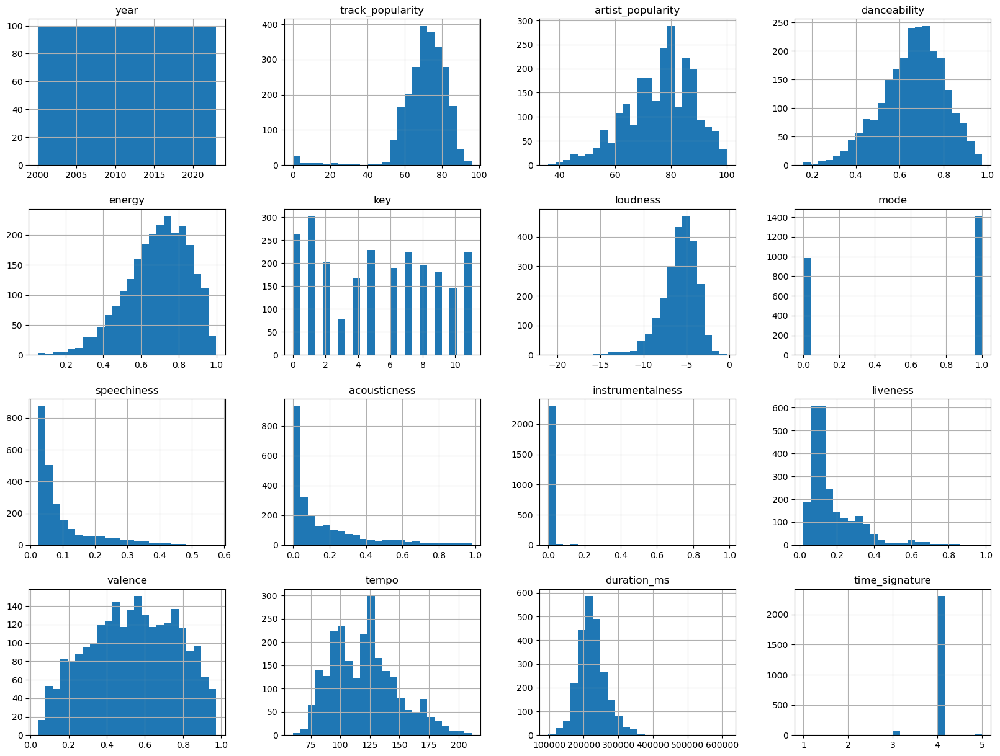

In [2132]:
hist = songs_df.hist(bins=24, figsize=(20,15))
fig = hist[0][0].get_figure()
fig.savefig('./Resources/Images/histo_panel.png')

### save the figure

### NOTE: ran the code commented out in this cell.<br>
Only one pair of column values were correlated (energy/ loudness)<br>

`from pandas.plotting import scatter_matrix
        attributes = ['track_popularity','artist_popularity', 'danceability',\
        'energy','speechiness', 'acousticness',\
        'instrumentalness', 'liveness','valence', 'tempo',

scatter_matrix(songs_df[attributes], figsize=(10,8))`

### Plot correlation between 'energy' 'loudness'

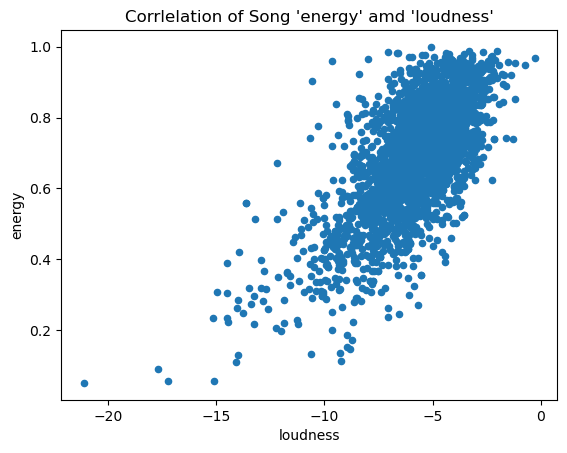

In [2136]:
songs_df.plot.scatter(x='loudness', y='energy')
plt.title("Corrlelation of Song 'energy' amd 'loudness'")
plt.show()


### calculate unpopularity threshold as a values less than 3 std deviations<br>
from the mean of popularity score

In [2138]:
unpopularity_threshold = calculate_unpopularity_threshold(songs_df, 'three_std')
print(f"Unpopularity threshold, calculated as score below 3 std from mean mean popularity: {unpopularity_threshold}")

Unpopularity threshold, calculated as score below 3 std from mean mean popularity: 32


### Count the tracks with popularity less than 3 std deviations from the mean 
- popularity threshhold = 32
- defined 'unpopular' as < 3 std from the mean popularoity score,
- std and mean extracted from 'songs_df.describe()', above

In [2143]:
track_count_with_popularity_below_32 = (songs_df['track_popularity'] < 32).sum()
print(f"There are {track_count_with_popularity_below_32} tracks with a popularity score less than 31")

There are 54 tracks with a popularity score less than 31


### Observations: 
1. 'loudness' values are negative: shift them to positve
2. 'loudness' and 'energy' are positively correlated
3. The data covers the years 2000 - 2023; every year represented; 100 tracks per year
4. There are no 'null'-containing rows
5. The are 98 duplicate tracks; remove them to leave 2400 - 98 = 2302 unique tracks
6. Taking three standard deviations from the popularity mean as the 'edge of popularity',<br>
(there are 53 unique, unpopular tracks in the data set and 2249 unique, popular tracks
8. Most tracks occur in the higher (more popular) range
9. The popularity of most tracks (2249/ 2301 tracks) is approxximately normally distributed
10. These 14 columns have quantitative values:
- 'track_popularity'
- 'artist_popularity'
- 'danceability'
- 'energy'
- 'key'
- 'loudness'
- 'mode'
- 'speechiness'
- 'acousticness'
- 'instrumentalness'
- 'liveness'
- 'valence'
- 'tempo'
- 'duration_ms'
9. These nine columns have categorical values:
- 'playlist_url'
- 'year'
- 'track_id'
- 'track_name'
- 'album'
- 'artist_id'
- 'artist_name'
- 'artist_genres'
- 'time_signature'
10. Some data columns are probably uninfomative and are candidates for removal
- 'playlist_url'
- 'year'
- 'track_name'
- 'album'
- 'artist_id'
- 'time_signature' (all songs have the same 4/4 time signiture)
11. 'track_id' can be convertedd to the index
12. there are no rows with null values


## Refactor the dataframe

### concatenate 'artist_genres'; write to a new column called 'artist_genres_concat'; delete 'artist_genres'

In [2148]:
songs_df = change_sublist_to_concatenated_string(songs_df, 'artist_genres', 'artist_genres_concat')

### transform loudness  by adding 21.107 so lowest value is zero

In [2150]:
column_to_transform = ['loudness']
songs_df = transform_neg_column_values_to_pos(songs_df, column_to_transform)
songs_df.head()

loudness


,playlist_url,year,track_id,track_name,track_popularity,album,artist_id,artist_name,artist_popularity,danceability,energy,key,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,artist_genres_concat,transformed_loudness
0,https://open.spotify.com/playlist/37i9dQZF1DWV...,2019,1BxfuPKGuaTgP7aM0Bbdwr,Cruel Summer,96,Lover,06HL4z0CvFAxyc27GXpf02,Taylor Swift,100,0.552,0.702,9,1,0.1570,0.1170,0.000021,0.1050,0.564,169.994,178427,4,pop,15.124
1,https://open.spotify.com/playlist/6unJBM7ZGitZ...,2023,1BxfuPKGuaTgP7aM0Bbdwr,Cruel Summer,96,Lover,06HL4z0CvFAxyc27GXpf02,Taylor Swift,100,0.552,0.702,9,1,0.1570,0.1170,0.000021,0.1050,0.564,169.994,178427,4,pop,15.124
2,https://open.spotify.com/playlist/6unJBM7ZGitZ...,2023,3rUGC1vUpkDG9CZFHMur1t,greedy,96,greedy,45dkTj5sMRSjrmBSBeiHym,Tate McRae,85,0.750,0.733,6,0,0.0319,0.2560,0.000000,0.1140,0.844,111.018,131872,1,pop,17.651
3,https://open.spotify.com/playlist/6unJBM7ZGitZ...,2023,3vkCueOmm7xQDoJ17W1Pm3,My Love Mine All Mine,94,The Land Is Inhospitable and So Are We,2uYWxilOVlUdk4oV9DvwqK,Mitski,84,0.504,0.308,9,1,0.0321,0.8680,0.135000,0.1580,0.121,113.950,137773,4,brooklyn+indie_pov:+indie,5.873
4,https://open.spotify.com/playlist/6unJBM7ZGitZ...,2023,4xhsWYTOGcal8zt0J161CU,Lovin On Me,93,Lovin On Me,2LIk90788K0zvyj2JJVwkJ,Jack Harlow,83,0.943,0.558,2,1,0.0568,0.0026,0.000002,0.0937,0.606,104.983,138411,4,deep+underground+hip+hop_kentucky+hip+hop_pop+...,15.920


### remove duplicate songs from list, keeping the first occurance

In [2152]:
songs_df = songs_df.drop_duplicates(subset=['track_id'], keep='first')

### make back-up dictionaries for future reference before purging columns
- {track_id: playlist_url}
- {track_id: track_name}
- {track_id: album}
- {track_id: artist_id}
- {track_id: artist_name}
- {track_id: mode}
- {track_id: time_signature}

In [2154]:
back_up_dicts = []
key_column = 'track_id'
value_columns = ['playlist_url', 'year', 'track_name', 'album', 'artist_id', \
                     'artist_name', 'mode', 'time_signature']
for value_column in value_columns:
    dict_name = 'track_id_playlist_' + value_column
    dict_name = make_backup_dict_of_columns(songs_df, key_column, value_column)
    back_up_dicts.append(dict_name)

### remove uninformative columns
- 'year'
- 'playlist_url'
- 'track_name'
- 'album'
- 'artist_name'
- 'artist_id'
- 'mode'
- 'time_signature'

In [2160]:
columns_to_remove = ['playlist_url','year','track_name','album','artist_name','artist_id','mode','time_signature' ]
songs_df = remove_columns(songs_df, columns_to_remove)

### check datframe datatypes. (Result: OK)

In [2163]:
songs_df.dtypes

track_id                 object
track_popularity          int64
artist_popularity         int64
danceability            float64
energy                  float64
key                       int64
speechiness             float64
acousticness            float64
instrumentalness        float64
liveness                float64
valence                 float64
tempo                   float64
duration_ms               int64
artist_genres_concat     object
transformed_loudness    float64
dtype: object

### check dataframe column names. (Result: OK)

In [2166]:
songs_df.columns

Index(['track_id', 'track_popularity', 'artist_popularity', 'danceability',
       'energy', 'key', 'speechiness', 'acousticness', 'instrumentalness',
       'liveness', 'valence', 'tempo', 'duration_ms', 'artist_genres_concat',
       'transformed_loudness'],
      dtype='object')

### check dataframe shape. (Result: 2302 rows, OK)

In [2168]:
songs_df.shape

(2302, 15)

## Create and add synthetic data to equalize data for popular and unpopular songs
### Note from histograph above that unpopular songs are underepresented in the data
- 'popular' is score from 32 - 100
- 'unpopular' is score less than 32

### create a dataframe of unpopular songs to feed synthetic data generator

In [2175]:
unpopular_songs_df  = songs_df[songs_df['track_popularity'] < 32]
unpopular_songs_df.head()

,track_id,track_popularity,artist_popularity,danceability,energy,key,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,artist_genres_concat,transformed_loudness
2346,2b8fOow8UzyDFAE27YhOZM,28,85,0.764,0.320,11,0.0546,0.8370,0.000000,0.0822,0.575,91.019,189486,pop,13.622
2347,5PjdY0CKGZdEuoNab3yDmX,28,79,0.591,0.764,1,0.0483,0.0383,0.000000,0.1030,0.478,169.928,141806,australian+hip+hop,15.347
2348,6fRxMU4LWwyaSSowV441IU,27,85,0.713,0.676,10,0.0270,0.0377,0.000000,0.1540,0.721,99.048,227395,pop,15.348
2349,7lPN2DXiMsVn7XUKtOW1CS,25,90,0.585,0.436,10,0.0601,0.7210,0.000013,0.1050,0.132,143.874,242014,pop,12.070
2350,4LRPiXqCikLlN15c3yImP7,23,85,0.520,0.731,6,0.0557,0.3420,0.001010,0.3110,0.662,173.930,167303,pop,15.493


In [2176]:
popular_songs_df = songs_df[songs_df['track_popularity'] >= 32]

In [2179]:
#unpopular_songs_df = convert_index_to_column(unpopular_songs_df, 'track_id')
unpopular_songs_df = convert_index_to_column(unpopular_songs_df, 'num_id')

In [2180]:
unpopular_songs_df.head()

,num_id,track_id,track_popularity,artist_popularity,danceability,energy,key,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,artist_genres_concat,transformed_loudness
0,2346,2b8fOow8UzyDFAE27YhOZM,28,85,0.764,0.320,11,0.0546,0.8370,0.000000,0.0822,0.575,91.019,189486,pop,13.622
1,2347,5PjdY0CKGZdEuoNab3yDmX,28,79,0.591,0.764,1,0.0483,0.0383,0.000000,0.1030,0.478,169.928,141806,australian+hip+hop,15.347
2,2348,6fRxMU4LWwyaSSowV441IU,27,85,0.713,0.676,10,0.0270,0.0377,0.000000,0.1540,0.721,99.048,227395,pop,15.348
3,2349,7lPN2DXiMsVn7XUKtOW1CS,25,90,0.585,0.436,10,0.0601,0.7210,0.000013,0.1050,0.132,143.874,242014,pop,12.070
4,2350,4LRPiXqCikLlN15c3yImP7,23,85,0.520,0.731,6,0.0557,0.3420,0.001010,0.3110,0.662,173.930,167303,pop,15.493


In [2183]:
unpopular_songs_df.shape

(53, 16)

### create 'metadata' for synthetic data generators

In [2186]:
filepath="./Resources/Metadata/unpopular_songs_augmented_metadata.json"
tablename = 'unpopular_songs_augmented_metadata'
metadata = create_and_save_metadata(unpopular_songs_df, filepath, tablename)

In [2188]:
metadata_dict = metadata.to_dict()
print(metadata_dict)

{'tables': {'unpopular_songs_augmented_metadata': {'columns': {'num_id': {'sdtype': 'id'}, 'track_id': {'sdtype': 'unknown', 'pii': True}, 'track_popularity': {'sdtype': 'numerical'}, 'artist_popularity': {'sdtype': 'numerical'}, 'danceability': {'sdtype': 'numerical'}, 'energy': {'sdtype': 'numerical'}, 'key': {'sdtype': 'numerical'}, 'speechiness': {'sdtype': 'numerical'}, 'acousticness': {'sdtype': 'numerical'}, 'instrumentalness': {'sdtype': 'numerical'}, 'liveness': {'sdtype': 'numerical'}, 'valence': {'sdtype': 'numerical'}, 'tempo': {'sdtype': 'numerical'}, 'duration_ms': {'sdtype': 'numerical'}, 'artist_genres_concat': {'sdtype': 'unknown', 'pii': True}, 'transformed_loudness': {'sdtype': 'numerical'}}, 'primary_key': 'num_id'}}, 'relationships': [], 'METADATA_SPEC_VERSION': 'V1'}


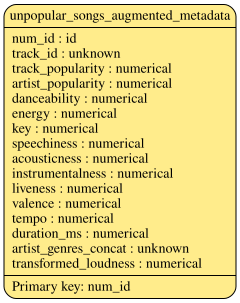

In [2190]:
metadata.visualize()

### inspect and update metadata

In [2193]:
metadata.update_column(
    column_name='track_id',
    sdtype='categorical')
metadata.update_column(
    column_name='artist_genres_concat',
    sdtype='categorical')

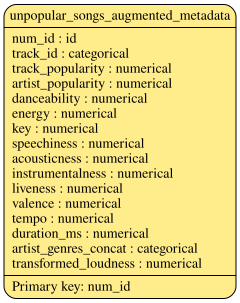

In [2195]:
metadata.visualize()

In [2197]:
# save metadata to json file
filepath="./Resources/Metadata/unpopular_songs_augmented_metadata_edit_1.json"
metadata.save_to_json(filepath)

### generate synthetic data rows with SVD GaussianCopulaSynthesizer
- visual inspection of the similarity of real and syntthetic data indicates that<br>
GaussianCopulaSynthesizer algorithm geneerates the most realistic data
- generate 2242 rows, to create a balanced unpopular/ popular data set

In [2201]:
synthetic_GaussianCopula_df = create_synthetic_data(unpopular_songs_df, metadata, GaussianCopulaSynthesizer, 2242)

In [2203]:
synthetic_GaussianCopula_df.shape

(2242, 16)

In [2205]:
# Save or use the synthetic data
synthetic_GaussianCopula_df.to_csv('./Resources/Synthesized_data/synthetic_GaussianCopula_data_1.csv', index=False)

### import 'synthetic_data.csv' into a pandas dataframe 'synthetic_data_df'

In [2208]:
synthetic_GaussianCopula_df = pd.read_csv('./Resources/Synthesized_data/synthetic_GaussianCopula_data_1.csv')

In [2210]:
synthetic_GaussianCopula_df

,num_id,track_id,track_popularity,artist_popularity,danceability,energy,key,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,artist_genres_concat,transformed_loudness
0,13788158,07bsRv0pcpbG4zJeLsUs1p,14,75,0.623,0.434,10,0.0643,0.49658,3.839300e-04,0.0598,0.5615,128.174,183144,hip+hop_rap,12.770441
1,12626117,1O2pcBJGej0pmH2Y9XZMs6,6,82,0.769,0.725,3,0.0856,0.01383,4.620600e-04,0.0894,0.5196,101.696,154507,alt+z_gen+z+singer-songwriter_singer-songwrite...,15.689579
2,11795059,2Wo6QQD1KMDWeFkkjLqwx5,20,91,0.797,0.792,10,0.2067,0.11248,9.692000e-05,0.0823,0.8093,106.360,190032,pop,16.793569
3,14576532,3KdoeNlEN0BoAKWzaRLNZa,3,86,0.676,0.641,6,0.0620,0.26194,6.560000e-06,0.1045,0.7519,127.314,178770,melodic+rap,15.547594
4,14035807,2i8f4VnnBjy0yDqH2C452a,23,93,0.709,0.663,10,0.0273,0.17552,1.628200e-04,0.2001,0.1651,105.977,298210,pop,15.087327
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2237,14824705,6PQ88X9TkUIAUIZJHW2upE,4,94,0.607,0.799,4,0.1260,0.00698,4.077000e-05,0.2844,0.5343,136.037,203235,dance+pop_pop,16.929689
2238,5364411,5PjdY0CKGZdEuoNab3yDmX,28,86,0.733,0.715,4,0.0330,0.67607,1.060600e-04,0.0689,0.6459,171.579,182863,pop,14.781840
2239,2175821,78Sw5GDo6AlGwTwanjXbGh,12,69,0.571,0.673,8,0.0432,0.47964,4.000000e-08,0.2769,0.4072,121.469,214785,r&b_rap_urban+contemporary,15.766624
2240,6418238,7MAibcTli4IisCtbHKrGMh,27,87,0.511,0.754,9,0.0423,0.25001,3.279700e-04,0.4250,0.5279,179.254,219899,pop,15.438385


### change track_id values to '123pseudoID'
- this synthetic entries dont have a real 'track_id'

In [2213]:
track_pseudo_id_list = []
for i in range(len(synthetic_GaussianCopula_df)):
    pseudo_id = 'pseudoID_' + str(i)
    track_pseudo_id_list.append(pseudo_id)
print(track_pseudo_id_list[0:5])
synthetic_GaussianCopula_df['track_id'] = track_pseudo_id_list

['pseudoID_0', 'pseudoID_1', 'pseudoID_2', 'pseudoID_3', 'pseudoID_4']


In [2215]:
synthetic_GaussianCopula_df.head()
synthetic_GaussianCopula_df.shape

(2242, 16)

### compare synthetic to real data

In [2218]:
quality_report = evaluate_quality(
    unpopular_songs_df,
    synthetic_GaussianCopula_df,
    metadata
)

Generating report ...

(1/2) Evaluating Column Shapes: |██████████| 16/16 [00:00<00:00, 230.97it/s]|
Column Shapes Score: 80.75%

(2/2) Evaluating Column Pair Trends: |██████████| 120/120 [00:00<00:00, 520.03it/s]|
Column Pair Trends Score: 75.82%

Overall Score (Average): 78.29%



In [2220]:
synthetic_GaussianCopula_df.columns

Index(['num_id', 'track_id', 'track_popularity', 'artist_popularity',
       'danceability', 'energy', 'key', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms',
       'artist_genres_concat', 'transformed_loudness'],
      dtype='object')

### plot the statistical similarity of synthetic and real data
- plots like these for the four synthetic data generators were used<br>
to complie the comparative figure shown above

column name: track_popularity


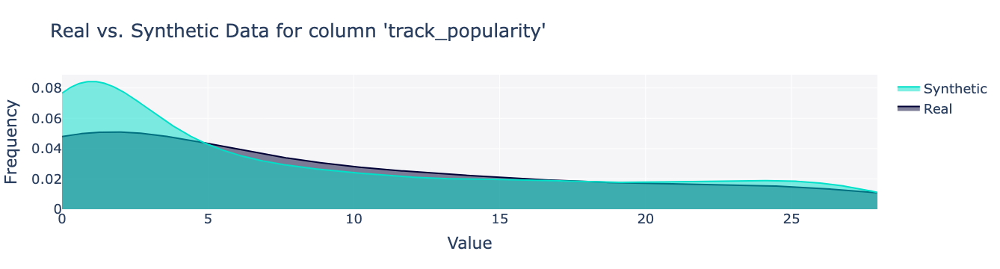

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
column name: artist_popularity


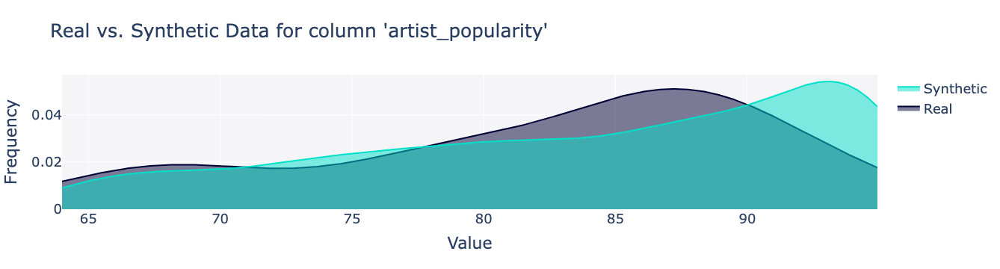

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
column name: danceability


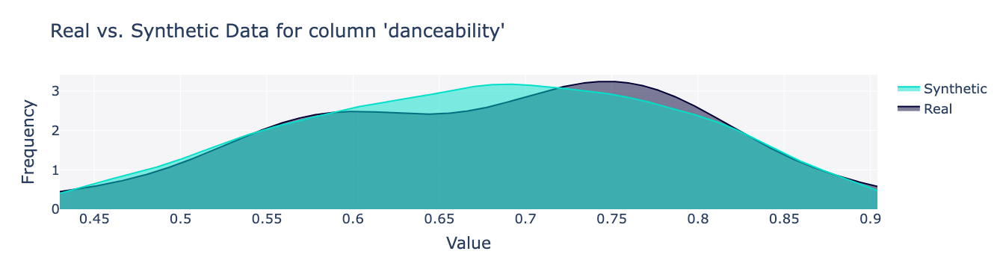

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
column name: energy


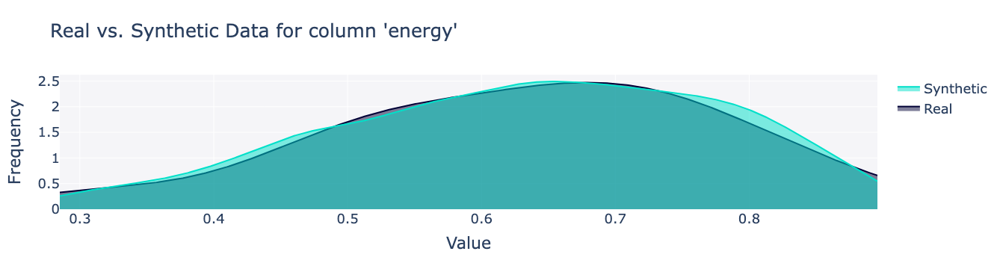

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
column name: key


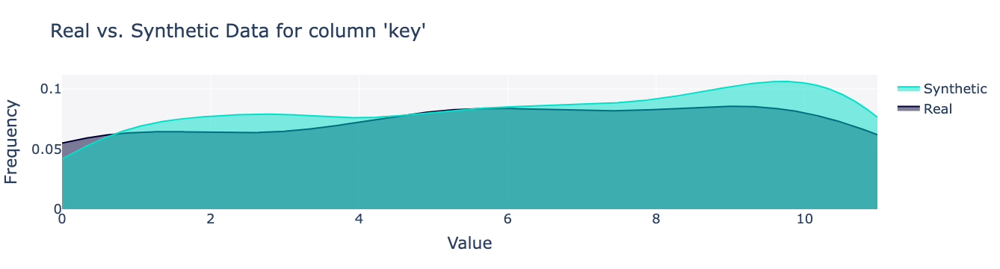

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
column name: speechiness


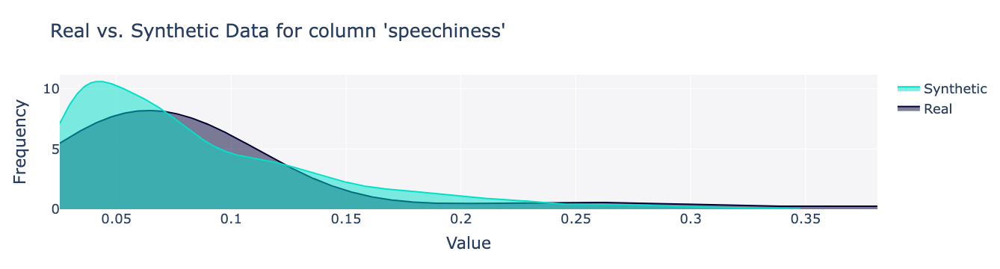

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
column name: acousticness


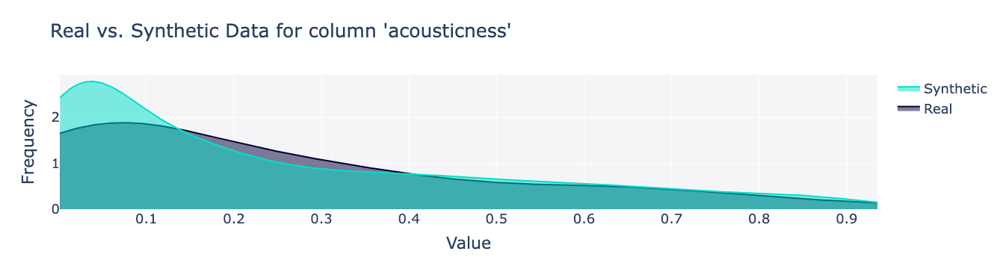

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
column name: instrumentalness


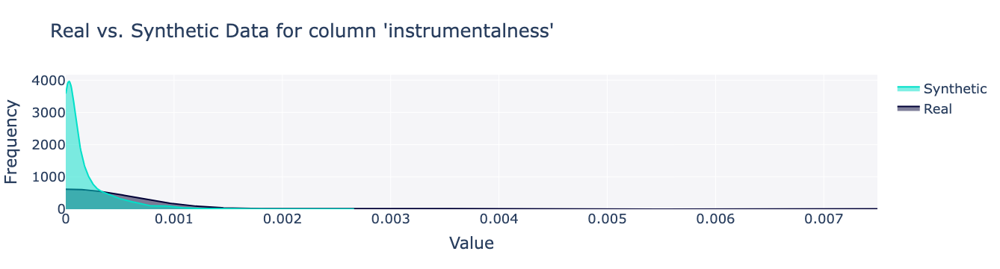

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
column name: liveness


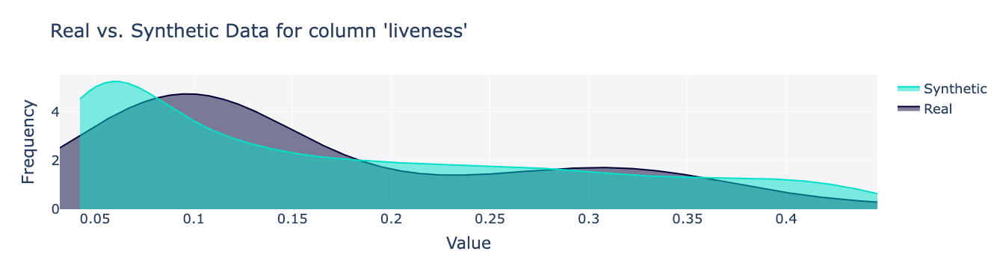

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
column name: valence


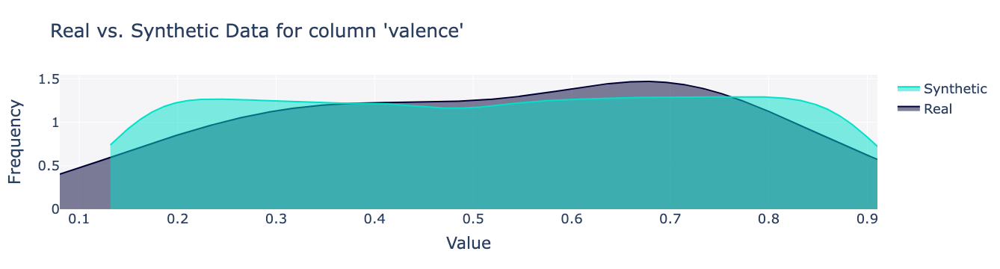

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
column name: tempo


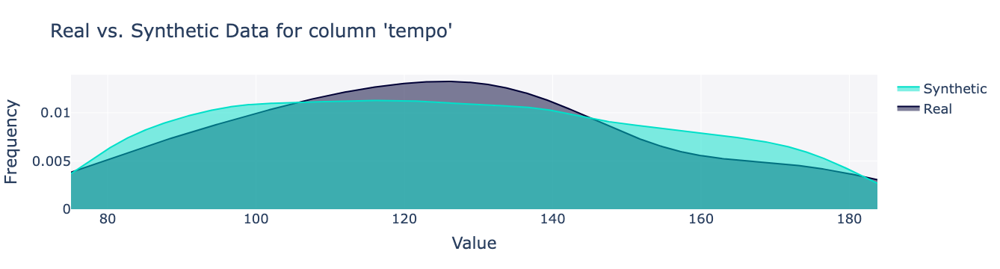

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
column name: duration_ms


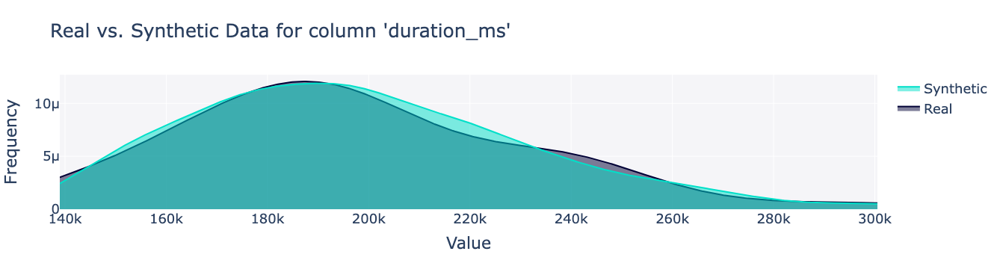

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
column name: transformed_loudness


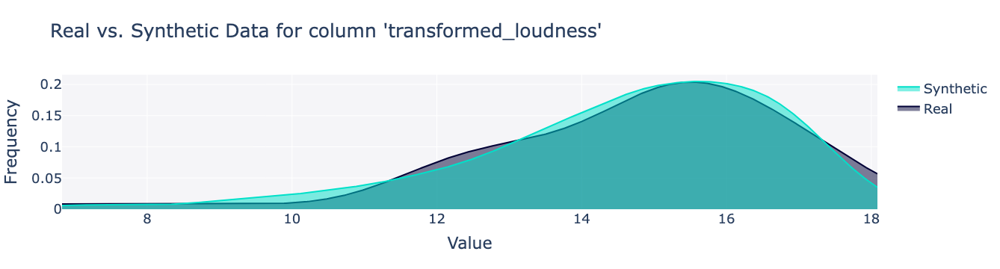

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


In [2223]:
column_names_to_plot= ['track_popularity', 'artist_popularity', 'danceability',\
                       'energy', 'key', 'speechiness', 'acousticness',\
                       'instrumentalness', 'liveness', 'valence', 'tempo',\
                       'duration_ms', 'transformed_loudness']
for column_name in column_names_to_plot:
    print(f"column name: {column_name}")
    fig = get_column_plot(column_name=column_name, real_data=unpopular_songs_df, synthetic_data=synthetic_GaussianCopula_df, metadata=metadata)
    fig.show()
    print('+' * 100)

### check compatible columns

In [2226]:
synth_col = list(synthetic_GaussianCopula_df.columns)
unpop_col = list(unpopular_songs_df.columns)
popular_col = list(popular_songs_df.columns)
songs_col = list(songs_df.columns)
list_of_lists = [synth_col, unpop_col, popular_col, songs_col]
list_equivilence_dict = test_lists_for_identity(list_of_lists)
for key,value in list_equivilence_dict.items():
   print(f"{key}: {value}")

list_0_to_list_1: equivilent
list_0_to_list_2: NOT equivilent
list_1_to_list_2: NOT equivilent


In [2228]:
synthetic_GaussianCopula_df.columns

Index(['num_id', 'track_id', 'track_popularity', 'artist_popularity',
       'danceability', 'energy', 'key', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms',
       'artist_genres_concat', 'transformed_loudness'],
      dtype='object')

In [2230]:
unpopular_songs_df.columns

Index(['num_id', 'track_id', 'track_popularity', 'artist_popularity',
       'danceability', 'energy', 'key', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms',
       'artist_genres_concat', 'transformed_loudness'],
      dtype='object')

In [2232]:
songs_df.columns

Index(['track_id', 'track_popularity', 'artist_popularity', 'danceability',
       'energy', 'key', 'speechiness', 'acousticness', 'instrumentalness',
       'liveness', 'valence', 'tempo', 'duration_ms', 'artist_genres_concat',
       'transformed_loudness'],
      dtype='object')

### remove 'num_id' from synthetic_GaussianCopula_df and unpopular_songs_df.columns
- (added to satisfy synthesizer requirement, unneeded otherwise)

In [2235]:
synthetic_GaussianCopula_df.drop('num_id', axis=1, inplace=True)
unpopular_songs_df.drop('num_id', axis=1, inplace=True)

In [2236]:
synth_col = list(synthetic_GaussianCopula_df.columns)
unpop_col = list(unpopular_songs_df.columns)
popular_col = list(popular_songs_df.columns)
songs_col = list(songs_df.columns)
list_of_lists = [synth_col, unpop_col, popular_col, songs_col]
list_equivilence_dict = test_lists_for_identity(list_of_lists)
for key,value in list_equivilence_dict.items():
   print(f"{key}: {value}")

list_0_to_list_1: equivilent
list_0_to_list_2: equivilent
list_1_to_list_2: equivilent


### add a popularity_class column  to the dataframes
- 0 = unpopular
- 1 = popular

In [2238]:
synthetic_GaussianCopula_df = add_column_to_dataframe_and_fill_with_a_value(synthetic_GaussianCopula_df, 'popularity_class', 0)
unpopular_songs_df = add_column_to_dataframe_and_fill_with_a_value(unpopular_songs_df, 'popularity_class', 0)
popular_songs_df = add_column_to_dataframe_and_fill_with_a_value(popular_songs_df, 'popularity_class', 1)

In [2242]:
### check 'popularity_class' value counts

In [2244]:
counts  = synthetic_GaussianCopula_df['popularity_class'].value_counts()
print(counts)

popularity_class
0    2242
Name: count, dtype: int64


In [2245]:
counts = unpopular_songs_df['popularity_class'].value_counts()
print(counts)

popularity_class
0    53
Name: count, dtype: int64


In [2248]:
counts = popular_songs_df['popularity_class'].value_counts()
print(counts)

popularity_class
1    2249
Name: count, dtype: int64


In [2250]:
list_equivilence_dict = test_lists_for_identity(list_of_lists)
for key,value in list_equivilence_dict.items():
   print(f"{key}: {value}")

list_0_to_list_1: equivilent
list_0_to_list_2: equivilent
list_1_to_list_2: equivilent


In [2252]:
synthetic_GaussianCopula_df.head(5)

,track_id,track_popularity,artist_popularity,danceability,energy,key,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,artist_genres_concat,transformed_loudness,popularity_class
0,pseudoID_0,14,75,0.623,0.434,10,0.0643,0.49658,0.000384,0.0598,0.5615,128.174,183144,hip+hop_rap,12.770441,0
1,pseudoID_1,6,82,0.769,0.725,3,0.0856,0.01383,0.000462,0.0894,0.5196,101.696,154507,alt+z_gen+z+singer-songwriter_singer-songwrite...,15.689579,0
2,pseudoID_2,20,91,0.797,0.792,10,0.2067,0.11248,0.000097,0.0823,0.8093,106.360,190032,pop,16.793569,0
3,pseudoID_3,3,86,0.676,0.641,6,0.0620,0.26194,0.000007,0.1045,0.7519,127.314,178770,melodic+rap,15.547594,0
4,pseudoID_4,23,93,0.709,0.663,10,0.0273,0.17552,0.000163,0.2001,0.1651,105.977,298210,pop,15.087327,0


In [2254]:
unpopular_songs_df.head(5)

,track_id,track_popularity,artist_popularity,danceability,energy,key,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,artist_genres_concat,transformed_loudness,popularity_class
0,2b8fOow8UzyDFAE27YhOZM,28,85,0.764,0.320,11,0.0546,0.8370,0.000000,0.0822,0.575,91.019,189486,pop,13.622,0
1,5PjdY0CKGZdEuoNab3yDmX,28,79,0.591,0.764,1,0.0483,0.0383,0.000000,0.1030,0.478,169.928,141806,australian+hip+hop,15.347,0
2,6fRxMU4LWwyaSSowV441IU,27,85,0.713,0.676,10,0.0270,0.0377,0.000000,0.1540,0.721,99.048,227395,pop,15.348,0
3,7lPN2DXiMsVn7XUKtOW1CS,25,90,0.585,0.436,10,0.0601,0.7210,0.000013,0.1050,0.132,143.874,242014,pop,12.070,0
4,4LRPiXqCikLlN15c3yImP7,23,85,0.520,0.731,6,0.0557,0.3420,0.001010,0.3110,0.662,173.930,167303,pop,15.493,0


In [2256]:
popular_songs_df.head(5)

,track_id,track_popularity,artist_popularity,danceability,energy,key,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,artist_genres_concat,transformed_loudness,popularity_class
0,1BxfuPKGuaTgP7aM0Bbdwr,96,100,0.552,0.702,9,0.1570,0.1170,0.000021,0.1050,0.564,169.994,178427,pop,15.124,1
2,3rUGC1vUpkDG9CZFHMur1t,96,85,0.750,0.733,6,0.0319,0.2560,0.000000,0.1140,0.844,111.018,131872,pop,17.651,1
3,3vkCueOmm7xQDoJ17W1Pm3,94,84,0.504,0.308,9,0.0321,0.8680,0.135000,0.1580,0.121,113.950,137773,brooklyn+indie_pov:+indie,5.873,1
4,4xhsWYTOGcal8zt0J161CU,93,83,0.943,0.558,2,0.0568,0.0026,0.000002,0.0937,0.606,104.983,138411,deep+underground+hip+hop_kentucky+hip+hop_pop+...,15.920,1
5,5XeFesFbtLpXzIVDNQP22n,93,86,0.464,0.417,0,0.0256,0.1360,0.022000,0.0974,0.479,67.528,183956,garage+rock_modern+rock_permanent+wave_rock_sh...,11.486,1


In [2258]:
## Merge dataframes

### 'stack' merge 'synthetic unpopular', 'real unpopular' and 'real popular' data
- synthetic_GaussianCopula_df
- unpopular_songs_df
- popular_songs_df

In [2261]:
df_list = [synthetic_GaussianCopula_df, unpopular_songs_df, popular_songs_df]
merged_df = pd.concat(df_list).reset_index(drop=True)

In [2263]:
merged_df.shape

(4544, 16)

In [2265]:
counts  = merged_df['popularity_class'].value_counts()
print(counts)

popularity_class
0    2295
1    2249
Name: count, dtype: int64


In [2267]:
merged_df.head()

,track_id,track_popularity,artist_popularity,danceability,energy,key,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,artist_genres_concat,transformed_loudness,popularity_class
0,pseudoID_0,14,75,0.623,0.434,10,0.0643,0.49658,0.000384,0.0598,0.5615,128.174,183144,hip+hop_rap,12.770441,0
1,pseudoID_1,6,82,0.769,0.725,3,0.0856,0.01383,0.000462,0.0894,0.5196,101.696,154507,alt+z_gen+z+singer-songwriter_singer-songwrite...,15.689579,0
2,pseudoID_2,20,91,0.797,0.792,10,0.2067,0.11248,0.000097,0.0823,0.8093,106.360,190032,pop,16.793569,0
3,pseudoID_3,3,86,0.676,0.641,6,0.0620,0.26194,0.000007,0.1045,0.7519,127.314,178770,melodic+rap,15.547594,0
4,pseudoID_4,23,93,0.709,0.663,10,0.0273,0.17552,0.000163,0.2001,0.1651,105.977,298210,pop,15.087327,0


### recast 'genres_concat' back to 'genres'

In [2270]:
merged_restored_df = unconcatenate_dataframe_column(merged_df, 'artist_genres_concat', 'artist_genres') 

In [2272]:
counts  = merged_restored_df['popularity_class'].value_counts()
print(counts)

popularity_class
0    2295
1    2249
Name: count, dtype: int64


In [2274]:
merged_restored_df.head()

,track_id,track_popularity,artist_popularity,danceability,energy,key,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,transformed_loudness,popularity_class,artist_genres
0,pseudoID_0,14,75,0.623,0.434,10,0.0643,0.49658,0.000384,0.0598,0.5615,128.174,183144,12.770441,0,"[hip hop, rap]"
1,pseudoID_1,6,82,0.769,0.725,3,0.0856,0.01383,0.000462,0.0894,0.5196,101.696,154507,15.689579,0,"[alt z, gen z singer-songwriter, singer-songwr..."
2,pseudoID_2,20,91,0.797,0.792,10,0.2067,0.11248,0.000097,0.0823,0.8093,106.360,190032,16.793569,0,[pop]
3,pseudoID_3,3,86,0.676,0.641,6,0.0620,0.26194,0.000007,0.1045,0.7519,127.314,178770,15.547594,0,[melodic rap]
4,pseudoID_4,23,93,0.709,0.663,10,0.0273,0.17552,0.000163,0.2001,0.1651,105.977,298210,15.087327,0,[pop]


In [2276]:
merged_restored_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4544 entries, 0 to 4543
Data columns (total 16 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   track_id              4544 non-null   object 
 1   track_popularity      4544 non-null   int64  
 2   artist_popularity     4544 non-null   int64  
 3   danceability          4544 non-null   float64
 4   energy                4544 non-null   float64
 5   key                   4544 non-null   int64  
 6   speechiness           4544 non-null   float64
 7   acousticness          4544 non-null   float64
 8   instrumentalness      4544 non-null   float64
 9   liveness              4544 non-null   float64
 10  valence               4544 non-null   float64
 11  tempo                 4544 non-null   float64
 12  duration_ms           4544 non-null   int64  
 13  transformed_loudness  4544 non-null   float64
 14  popularity_class      4544 non-null   int64  
 15  artist_genres        

### make some working copies

In [2279]:
merged_restored_df_archive = merged_restored_df.copy()
merged_restored_onehot_df = merged_restored_df.copy()
merged_restored_dropped_generes_df = merged_restored_df.copy()

## test rf classifier with one-hot encoded 'artist_generes'

### one-hot encode 'artist_generes'

In [2283]:
merged_restored_onehot_df = convert_index_to_column(merged_restored_onehot_df, 'track_id')

In [2285]:
merged_restored_onehot_df = one_hot_encode_genres(merged_restored_onehot_df, 'artist_genres', 8)

row_count: 4544
all_genres_list: 12662
['hip_hop', 'rap', 'alt_z', 'gen_z_singer-songwriter', 'singer-songwriter_pop']


In [2286]:
counts  = merged_restored_onehot_df['popularity_class'].value_counts()
print(counts)

popularity_class
0    2295
1    2249
Name: count, dtype: int64


In [2289]:
pd.set_option('display.max_columns', None)
merged_restored_onehot_df.head()

,track_id,track_id,track_popularity,artist_popularity,danceability,energy,key,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,transformed_loudness,popularity_class,pop,rap,dance_pop,pop_rap,hip_hop,k-pop,r&b,urban_contemporary,uk_pop,singer-songwriter_pop,k-pop_boy_group,art_pop,trap,melodic_rap,modern_rock,canadian_pop,chicago_rap,rock,southern_hip_hop,hip_pop,edm,pop_dance,permanent_wave,alt_z,boy_band,urbano_latino,neo_mellow,gangster_rap,metropopolis,atl_hip_hop,pov:_indie,indietronica,post-grunge,post-teen_pop,alternative_metal,talent_show,viral_pop,pop_rock,dirty_south_rap,ohio_hip_hop,canadian_contemporary_r&b,piano_rock,west_coast_rap,nz_pop,slap_house,conscious_hip_hop,contemporary_r&b,k-pop_girl_group,trap_latino,gauze_pop,shiver_pop,singer-songwriter,new_wave_pop,kentucky_hip_hop,reggaeton,deep_underground_hip_hop,baroque_pop,uk_dance,east_coast_hip_hop,nu_metal,neo_soul,australian_hip_hop,europop,art_rock,cali_rap,miami_hip_hop,uk_contemporary_r&b,mambo_chileno,gen_z_singer-songwriter,urbano_chileno,girl_group,bedroom_pop,electro_house,bedroom_soul,british_soul,canadian_hip_hop,country,alternative_rock,house,contemporary_country,pop_punk,detroit_hip_hop,progressive_house,latin_pop,brooklyn_drill,barbadian_pop,country_road,progressive_electro_house,queens_hip_hop,candy_pop,pop_soul,eurodance,modern_alternative_rock,old_school_atlanta_hip_hop,australian_pop,dance_rock,crunk,neon_pop_punk,electropop,garage_rock,,funk_metal,big_room,folk-pop,indie_rock,brostep,hardcore_hip_hop,south_carolina_hip_hop,dfw_rap,trap_queen,rap_metal,lgbtq__hip_hop,canadian_rock,australian_dance,mexican_pop,indie_poptimism,punk,new_orleans_rap,colombian_pop,reggaeton_colombiano,country_dawn,g_funk,neo-synthpop,tropical_house,lilith,st_louis_rap,swedish_electropop,dancehall,stomp_and_holler,latin_hip_hop,filter_house,emo,reggae_fusion,disco_house,swedish_pop,modern_country_rock,german_techno,genre_other
0,0,pseudoID_0,14,75,0.623,0.434,10,0.0643,0.49658,0.000384,0.0598,0.5615,128.174,183144,12.770441,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
1,1,pseudoID_1,6,82,0.769,0.725,3,0.0856,0.01383,0.000462,0.0894,0.5196,101.696,154507,15.689579,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
2,2,pseudoID_2,20,91,0.797,0.792,10,0.2067,0.11248,0.000097,0.0823,0.8093,106.360,190032,16.793569,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
3,3,pseudoID_3,3,86,0.676,0.641,6,0.0620,0.26194,0.000007,0.1045,0.7519,127.314,178770,15.547594,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
4,4,pseudoID_4,23,93,0.709,0.663,10,0.0273,0.17552,0.000163,0.2001,0.1651,105.977,298210,15.087327,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1


## Classification Analysis

### I. randomforest classification on merged_restored_df
- this version of the data HAS been one-hot encoded for 'artist_genres'

### make and run a random forest model on the onehot encoded data
- data in 'merged_restored_onehot_df'

### move 'track_id" to index

In [2295]:
column_to_convert = 'track_id'
merged_restored_onehot_df = convert_column_to_index(merged_restored_onehot_df, column_to_convert)

In [2297]:
merged_restored_onehot_df.head()

,track_popularity,artist_popularity,danceability,energy,key,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,transformed_loudness,popularity_class,pop,rap,dance_pop,pop_rap,hip_hop,k-pop,r&b,urban_contemporary,uk_pop,singer-songwriter_pop,k-pop_boy_group,art_pop,trap,melodic_rap,modern_rock,canadian_pop,chicago_rap,rock,southern_hip_hop,hip_pop,edm,pop_dance,permanent_wave,alt_z,boy_band,urbano_latino,neo_mellow,gangster_rap,metropopolis,atl_hip_hop,pov:_indie,indietronica,post-grunge,post-teen_pop,alternative_metal,talent_show,viral_pop,pop_rock,dirty_south_rap,ohio_hip_hop,canadian_contemporary_r&b,piano_rock,west_coast_rap,nz_pop,slap_house,conscious_hip_hop,contemporary_r&b,k-pop_girl_group,trap_latino,gauze_pop,shiver_pop,singer-songwriter,new_wave_pop,kentucky_hip_hop,reggaeton,deep_underground_hip_hop,baroque_pop,uk_dance,east_coast_hip_hop,nu_metal,neo_soul,australian_hip_hop,europop,art_rock,cali_rap,miami_hip_hop,uk_contemporary_r&b,mambo_chileno,gen_z_singer-songwriter,urbano_chileno,girl_group,bedroom_pop,electro_house,bedroom_soul,british_soul,canadian_hip_hop,country,alternative_rock,house,contemporary_country,pop_punk,detroit_hip_hop,progressive_house,latin_pop,brooklyn_drill,barbadian_pop,country_road,progressive_electro_house,queens_hip_hop,candy_pop,pop_soul,eurodance,modern_alternative_rock,old_school_atlanta_hip_hop,australian_pop,dance_rock,crunk,neon_pop_punk,electropop,garage_rock,,funk_metal,big_room,folk-pop,indie_rock,brostep,hardcore_hip_hop,south_carolina_hip_hop,dfw_rap,trap_queen,rap_metal,lgbtq__hip_hop,canadian_rock,australian_dance,mexican_pop,indie_poptimism,punk,new_orleans_rap,colombian_pop,reggaeton_colombiano,country_dawn,g_funk,neo-synthpop,tropical_house,lilith,st_louis_rap,swedish_electropop,dancehall,stomp_and_holler,latin_hip_hop,filter_house,emo,reggae_fusion,disco_house,swedish_pop,modern_country_rock,german_techno,genre_other
track_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
"(0, pseudoID_0)",14,75,0.623,0.434,10,0.0643,0.49658,0.000384,0.0598,0.5615,128.174,183144,12.770441,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
"(1, pseudoID_1)",6,82,0.769,0.725,3,0.0856,0.01383,0.000462,0.0894,0.5196,101.696,154507,15.689579,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
"(2, pseudoID_2)",20,91,0.797,0.792,10,0.2067,0.11248,0.000097,0.0823,0.8093,106.360,190032,16.793569,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
"(3, pseudoID_3)",3,86,0.676,0.641,6,0.0620,0.26194,0.000007,0.1045,0.7519,127.314,178770,15.547594,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
"(4, pseudoID_4)",23,93,0.709,0.663,10,0.0273,0.17552,0.000163,0.2001,0.1651,105.977,298210,15.087327,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1


### make and run rf model on 'merged_restored_onehot_df'
popularity_class
- 0    2295
- 1    2249

In [2300]:
y_column_name = 'popularity_class'
random_state = 42
n_estimators = 500
rf_onehot_results_list = make_and_run_RandomForestModel(merged_restored_onehot_df, y_column_name, random_state, n_estimators)

### display model evalution 
- IMPORTANT NOTE: do not name this 'accuracy_score' -- this overwrites<br>
the definition of the function 'accuracy_score', causing an error

In [2303]:
confusion_matrix_df = rf_onehot_results_list[2]
accu_score = rf_onehot_results_list[3]
class_report = rf_onehot_results_list[4]

In [2305]:
print("Confusion Matrix ('merged_restored_onehot_df'):")
display(confusion_matrix_df)

Confusion Matrix ('merged_restored_onehot_df'):


,Predicted 0,Predicted 1
Actual 0,592,0
Actual 1,1,543


In [2307]:
print(f"Accuracy Score: {accu_score}")

Accuracy Score: 0.9991197183098591


In [2309]:
print(class_report)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       592
           1       1.00      1.00      1.00       544

    accuracy                           1.00      1136
   macro avg       1.00      1.00      1.00      1136
weighted avg       1.00      1.00      1.00      1136



### Observation: accuracy looks too high

### II. randomforest classification on 'merged_restored_dropped_generes_df'
- this version of the data HAS NOT been one-hot encoded for 'artist_generes'<br>
- 'artist_genres' data nas been removed from 'dropped_generes_df'

In [2313]:
merged_restored_dropped_generes_df = merged_restored_df.drop(columns='artist_genres')
merged_restored_dropped_generes_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4544 entries, 0 to 4543
Data columns (total 15 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   track_id              4544 non-null   object 
 1   track_popularity      4544 non-null   int64  
 2   artist_popularity     4544 non-null   int64  
 3   danceability          4544 non-null   float64
 4   energy                4544 non-null   float64
 5   key                   4544 non-null   int64  
 6   speechiness           4544 non-null   float64
 7   acousticness          4544 non-null   float64
 8   instrumentalness      4544 non-null   float64
 9   liveness              4544 non-null   float64
 10  valence               4544 non-null   float64
 11  tempo                 4544 non-null   float64
 12  duration_ms           4544 non-null   int64  
 13  transformed_loudness  4544 non-null   float64
 14  popularity_class      4544 non-null   int64  
dtypes: float64(9), int64(

In [2315]:
column_to_convert = 'track_id'
merged_restored_dropped_generes_df = convert_column_to_index(merged_restored_dropped_generes_df, column_to_convert)

In [2317]:
merged_restored_dropped_generes_df.head()

,track_popularity,artist_popularity,danceability,energy,key,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,transformed_loudness,popularity_class
track_id,,,,,,,,,,,,,,
pseudoID_0,14,75,0.623,0.434,10,0.0643,0.49658,0.000384,0.0598,0.5615,128.174,183144,12.770441,0
pseudoID_1,6,82,0.769,0.725,3,0.0856,0.01383,0.000462,0.0894,0.5196,101.696,154507,15.689579,0
pseudoID_2,20,91,0.797,0.792,10,0.2067,0.11248,0.000097,0.0823,0.8093,106.360,190032,16.793569,0
pseudoID_3,3,86,0.676,0.641,6,0.0620,0.26194,0.000007,0.1045,0.7519,127.314,178770,15.547594,0
pseudoID_4,23,93,0.709,0.663,10,0.0273,0.17552,0.000163,0.2001,0.1651,105.977,298210,15.087327,0


### make and run a random forest model on 'merged_restored_dropped_generes_df'
popularity_class
- 0    2295
- 1    2249

In [2320]:
counts  = merged_restored_dropped_generes_df['popularity_class'].value_counts()
print(counts)

popularity_class
0    2295
1    2249
Name: count, dtype: int64


In [2322]:
y_column_name = 'popularity_class'
random_state = 42
n_estimators = 500
rf_results_list = make_and_run_RandomForestModel(merged_restored_dropped_generes_df, y_column_name, random_state, n_estimators)

### display model evalution 
- IMPORTANT NOTE: do not name the variable exactly as 'accuracy_score' -- this overwrites<br>
the definetion of the function 'accuracy_score', causing an error


In [2324]:
confusion_matrix_df_2 = rf_results_list[2]
accu_score_2 = rf_results_list[3]
class_report_2 = rf_results_list[4]

In [2327]:
print("Confusion Matrix ('merged_restored_dropped_generes_df'):")
display(confusion_matrix_df_2)

Confusion Matrix ('merged_restored_dropped_generes_df'):


,Predicted 0,Predicted 1
Actual 0,592,0
Actual 1,1,543


In [2329]:
print(f"Accuracy Score: {accu_score_2}")

Accuracy Score: 0.9991197183098591


In [2331]:
print(class_report_2)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       592
           1       1.00      1.00      1.00       544

    accuracy                           1.00      1136
   macro avg       1.00      1.00      1.00      1136
weighted avg       1.00      1.00      1.00      1136



### Observation: accuracy still unrealistically good

### III. randomforest classification on 'songs_0_pc_synthetic_df'
- this version of the data is onehot encoded
- it contains no synthetic data

### merge unpopular_songs_df and popular_songs_df

In [2336]:
df_list = [unpopular_songs_df, popular_songs_df]
songs_0_pc_synthetic_df = pd.concat(df_list).reset_index(drop=True)

In [2338]:
songs_0_pc_synthetic_df.head()

,track_id,track_popularity,artist_popularity,danceability,energy,key,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,artist_genres_concat,transformed_loudness,popularity_class
0,2b8fOow8UzyDFAE27YhOZM,28,85,0.764,0.320,11,0.0546,0.8370,0.000000,0.0822,0.575,91.019,189486,pop,13.622,0
1,5PjdY0CKGZdEuoNab3yDmX,28,79,0.591,0.764,1,0.0483,0.0383,0.000000,0.1030,0.478,169.928,141806,australian+hip+hop,15.347,0
2,6fRxMU4LWwyaSSowV441IU,27,85,0.713,0.676,10,0.0270,0.0377,0.000000,0.1540,0.721,99.048,227395,pop,15.348,0
3,7lPN2DXiMsVn7XUKtOW1CS,25,90,0.585,0.436,10,0.0601,0.7210,0.000013,0.1050,0.132,143.874,242014,pop,12.070,0
4,4LRPiXqCikLlN15c3yImP7,23,85,0.520,0.731,6,0.0557,0.3420,0.001010,0.3110,0.662,173.930,167303,pop,15.493,0


In [2340]:
max_popularity = songs_0_pc_synthetic_df['track_popularity'].max()
print(max_popularity)

96


### set index to column 'track_id'

In [2343]:
songs_0_pc_synthetic_df = convert_index_to_column(songs_0_pc_synthetic_df, 'track_id')

### convert concatenated genres to original format

In [2346]:
songs_0_pc_synthetic_df = unconcatenate_dataframe_column(songs_0_pc_synthetic_df, 'artist_genres_concat', 'artist_genres') 

### one-hotencode

In [2349]:
songs_0_pc_synthetic_df = one_hot_encode_genres(songs_0_pc_synthetic_df, 'artist_genres', 8)

row_count: 2302
all_genres_list: 7610
['pop', 'australian_hip_hop', 'pop', 'pop', 'pop']


In [2523]:
songs_0_pc_synthetic_df.shape

(2302, 135)

### set column 'track_id' to index

In [2351]:
column_to_convert = 'track_id'
songs_0_pc_synthetic_df = convert_column_to_index(songs_0_pc_synthetic_df, column_to_convert)

In [2517]:
songs_0_pc_synthetic_df.shape

(2302, 135)

In [2521]:
songs_0_pc_synthetic_df.head()

,track_popularity,artist_popularity,danceability,energy,key,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,transformed_loudness,popularity_class,pop,dance_pop,rap,pop_rap,hip_hop,r&b,urban_contemporary,trap,modern_rock,rock,southern_hip_hop,canadian_pop,hip_pop,edm,pop_dance,uk_pop,neo_mellow,gangster_rap,atl_hip_hop,post-grunge,post-teen_pop,alternative_metal,talent_show,pop_rock,dirty_south_rap,permanent_wave,contemporary_r&b,boy_band,urbano_latino,trap_latino,reggaeton,uk_dance,east_coast_hip_hop,neo_soul,nu_metal,melodic_rap,europop,miami_hip_hop,art_pop,girl_group,electro_house,chicago_rap,canadian_hip_hop,british_soul,country,alternative_rock,house,contemporary_country,viral_pop,indietronica,pov:_indie,detroit_hip_hop,pop_punk,progressive_house,latin_pop,country_road,barbadian_pop,metropopolis,singer-songwriter_pop,canadian_contemporary_r&b,queens_hip_hop,progressive_electro_house,piano_rock,west_coast_rap,pop_soul,candy_pop,eurodance,conscious_hip_hop,modern_alternative_rock,k-pop,old_school_atlanta_hip_hop,crunk,australian_pop,dance_rock,neon_pop_punk,garage_rock,electropop,funk_metal,,alt_z,big_room,indie_rock,folk-pop,slap_house,south_carolina_hip_hop,hardcore_hip_hop,brostep,dfw_rap,trap_queen,rap_metal,lgbtq__hip_hop,mexican_pop,australian_dance,indie_poptimism,canadian_rock,reggaeton_colombiano,punk,singer-songwriter,new_orleans_rap,colombian_pop,country_dawn,neo-synthpop,lilith,g_funk,new_wave_pop,tropical_house,st_louis_rap,emo,stomp_and_holler,filter_house,swedish_electropop,latin_hip_hop,dancehall,australian_hip_hop,swedish_pop,reggae_fusion,modern_country_rock,german_techno,disco_house,k-pop_girl_group,genre_other
track_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
"(0, 2b8fOow8UzyDFAE27YhOZM)",28,85,0.764,0.320,11,0.0546,0.8370,0.000000,0.0822,0.575,91.019,189486,13.622,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
"(1, 5PjdY0CKGZdEuoNab3yDmX)",28,79,0.591,0.764,1,0.0483,0.0383,0.000000,0.1030,0.478,169.928,141806,15.347,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1
"(2, 6fRxMU4LWwyaSSowV441IU)",27,85,0.713,0.676,10,0.0270,0.0377,0.000000,0.1540,0.721,99.048,227395,15.348,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
"(3, 7lPN2DXiMsVn7XUKtOW1CS)",25,90,0.585,0.436,10,0.0601,0.7210,0.000013,0.1050,0.132,143.874,242014,12.070,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
"(4, 4LRPiXqCikLlN15c3yImP7)",23,85,0.520,0.731,6,0.0557,0.3420,0.001010,0.3110,0.662,173.930,167303,15.493,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1


### make and run random forest

In [2355]:
y_column_name = 'popularity_class'
random_state = 42
n_estimators = 500
rf_results_list = make_and_run_RandomForestModel(songs_0_pc_synthetic_df, y_column_name, random_state, n_estimators)

In [2357]:
confusion_matrix_df_3 = rf_results_list[2]
accu_score_3 = rf_results_list[3]
class_report_3 = rf_results_list[4]

In [2359]:
print("Confusion Matrix ('merged_restored_dropped_generes_df'):")
display(confusion_matrix_df_3)

Confusion Matrix ('merged_restored_dropped_generes_df'):


,Predicted 0,Predicted 1
Actual 0,10,0
Actual 1,0,566


In [2361]:
print(f"Accuracy Score: {accu_score_3}")

Accuracy Score: 1.0


In [2362]:
print(class_report_3)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        10
           1       1.00      1.00      1.00       566

    accuracy                           1.00       576
   macro avg       1.00      1.00      1.00       576
weighted avg       1.00      1.00      1.00       576



## Intermediate observation: classification working too well
- work almost perfectly with or without synthetic data
- (Hypothesis: the impossibly good performance is driven by the very stringent definition of 'unpopular' used<br>
where unpopular = less than three std from the mean)<br>
To test this, reanalyse data with a spectrum of three popularity thresholds: 
- mean popularity threshhold (70)
- 1 std (57)
- 2 std (44)

In [2364]:
songs_0_pc_synthetic_df.shape

(2302, 135)

In [2365]:
songs_0_pc_synthetic_pop_eq_mean_df = adjust_popularity_class(songs_0_pc_synthetic_df,'track_popularity' , 'popularity_class', 70)
songs_0_pc_synthetic_pop_eq_1std_df = adjust_popularity_class(songs_0_pc_synthetic_df, 'track_popularity', 'popularity_class', 57)
songs_0_pc_synthetic_pop_eq_2std_df = adjust_popularity_class(songs_0_pc_synthetic_df, 'track_popularity', 'popularity_class', 44)

lenght target column: 2302
lenght target column: 2302
lenght target column: 2302
lenght target column: 2302
lenght target column: 2302
lenght target column: 2302


In [2366]:
songs_0_pc_synthetic_pop_eq_mean_df.shape

(2302, 135)

In [2372]:
songs_0_pc_synthetic_pop_eq_mean_df['popularity_class'].value_counts()

popularity_class
1    1341
0     961
Name: count, dtype: int64

In [2374]:
songs_0_pc_synthetic_df['popularity_class'].value_counts()

popularity_class
1    2249
0      53
Name: count, dtype: int64

In [2376]:
songs_0_pc_synthetic_pop_eq_1std_df['popularity_class'].value_counts()

popularity_class
1    2138
0     164
Name: count, dtype: int64

In [2378]:
songs_0_pc_synthetic_pop_eq_2std_df['popularity_class'].value_counts()

popularity_class
1    2246
0      56
Name: count, dtype: int64

In [2380]:
songs_0_pc_synthetic_pop_eq_mean_df.head()

,track_popularity,artist_popularity,danceability,energy,key,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,transformed_loudness,popularity_class,pop,dance_pop,rap,pop_rap,hip_hop,r&b,urban_contemporary,trap,modern_rock,rock,southern_hip_hop,canadian_pop,hip_pop,edm,pop_dance,uk_pop,neo_mellow,gangster_rap,atl_hip_hop,post-grunge,post-teen_pop,alternative_metal,talent_show,pop_rock,dirty_south_rap,permanent_wave,contemporary_r&b,boy_band,urbano_latino,trap_latino,reggaeton,uk_dance,east_coast_hip_hop,neo_soul,nu_metal,melodic_rap,europop,miami_hip_hop,art_pop,girl_group,electro_house,chicago_rap,canadian_hip_hop,british_soul,country,alternative_rock,house,contemporary_country,viral_pop,indietronica,pov:_indie,detroit_hip_hop,pop_punk,progressive_house,latin_pop,country_road,barbadian_pop,metropopolis,singer-songwriter_pop,canadian_contemporary_r&b,queens_hip_hop,progressive_electro_house,piano_rock,west_coast_rap,pop_soul,candy_pop,eurodance,conscious_hip_hop,modern_alternative_rock,k-pop,old_school_atlanta_hip_hop,crunk,australian_pop,dance_rock,neon_pop_punk,garage_rock,electropop,funk_metal,,alt_z,big_room,indie_rock,folk-pop,slap_house,south_carolina_hip_hop,hardcore_hip_hop,brostep,dfw_rap,trap_queen,rap_metal,lgbtq__hip_hop,mexican_pop,australian_dance,indie_poptimism,canadian_rock,reggaeton_colombiano,punk,singer-songwriter,new_orleans_rap,colombian_pop,country_dawn,neo-synthpop,lilith,g_funk,new_wave_pop,tropical_house,st_louis_rap,emo,stomp_and_holler,filter_house,swedish_electropop,latin_hip_hop,dancehall,australian_hip_hop,swedish_pop,reggae_fusion,modern_country_rock,german_techno,disco_house,k-pop_girl_group,genre_other
track_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
"(0, 2b8fOow8UzyDFAE27YhOZM)",28,85,0.764,0.320,11,0.0546,0.8370,0.000000,0.0822,0.575,91.019,189486,13.622,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
"(1, 5PjdY0CKGZdEuoNab3yDmX)",28,79,0.591,0.764,1,0.0483,0.0383,0.000000,0.1030,0.478,169.928,141806,15.347,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1
"(2, 6fRxMU4LWwyaSSowV441IU)",27,85,0.713,0.676,10,0.0270,0.0377,0.000000,0.1540,0.721,99.048,227395,15.348,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
"(3, 7lPN2DXiMsVn7XUKtOW1CS)",25,90,0.585,0.436,10,0.0601,0.7210,0.000013,0.1050,0.132,143.874,242014,12.070,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
"(4, 4LRPiXqCikLlN15c3yImP7)",23,85,0.520,0.731,6,0.0557,0.3420,0.001010,0.3110,0.662,173.930,167303,15.493,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1


### make and run random forest on 'songs_0_pc_synthetic_pop_eq_mean_df'
- popular: 1    1341
- unpoplr: 0     961

In [2384]:
y_column_name = 'popularity_class'
random_state = 42
n_estimators = 500
rf_results_list = make_and_run_RandomForestModel(songs_0_pc_synthetic_pop_eq_mean_df, y_column_name, random_state, n_estimators)

In [2386]:
confusion_matrix_df_4 = rf_results_list[2]
accu_score_4 = rf_results_list[3]
class_report_4 = rf_results_list[4]

In [2388]:
print("Confusion Matrix ('songs_0_pc_synthetic_pop_eq_mean_df'):")
display(confusion_matrix_df_4)

Confusion Matrix ('songs_0_pc_synthetic_pop_eq_mean_df'):


,Predicted 0,Predicted 1
Actual 0,236,0
Actual 1,0,340


In [2390]:
print(f"Accuracy Score: {accu_score_4}")

Accuracy Score: 1.0


In [2391]:
print(class_report_4)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       236
           1       1.00      1.00      1.00       340

    accuracy                           1.00       576
   macro avg       1.00      1.00      1.00       576
weighted avg       1.00      1.00      1.00       576



### make and run random forest on 'songs_0_pc_synthetic_pop_eq_1std_df'
- popular: 1    2138
- unpoplr: 0     164

In [2395]:
y_column_name = 'popularity_class'
random_state = 42
n_estimators = 500
rf_results_list = make_and_run_RandomForestModel(songs_0_pc_synthetic_pop_eq_1std_df, y_column_name, random_state, n_estimators)

In [2397]:
confusion_matrix_df_5 = rf_results_list[2]
accu_score_5 = rf_results_list[3]
class_report_5 = rf_results_list[4]

In [2399]:
print("Confusion Matrix ('songs_0_pc_synthetic_pop_eq_1std_df'):")
display(confusion_matrix_df_5)

Confusion Matrix ('songs_0_pc_synthetic_pop_eq_1std_df'):


,Predicted 0,Predicted 1
Actual 0,33,0
Actual 1,0,543


In [2401]:
print(f"Accuracy Score: {accu_score_5}")

Accuracy Score: 1.0


In [2403]:
print(class_report_5)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        33
           1       1.00      1.00      1.00       543

    accuracy                           1.00       576
   macro avg       1.00      1.00      1.00       576
weighted avg       1.00      1.00      1.00       576



### make and run random forest on 'songs_0_pc_synthetic_pop_eq_2std_df'
- popular: 1    2246
- unpoplr: 0      56

In [2406]:
y_column_name = 'popularity_class'
random_state = 42
n_estimators = 500
rf_results_list = make_and_run_RandomForestModel(songs_0_pc_synthetic_pop_eq_2std_df, y_column_name, random_state, n_estimators)

In [2408]:
confusion_matrix_df_6 = rf_results_list[2]
accu_score_6 = rf_results_list[3]
class_report_6 = rf_results_list[4]

In [2410]:
print("Confusion Matrix ('songs_0_pc_synthetic_pop_eq_2std_df'):")
display(confusion_matrix_df_5)

Confusion Matrix ('songs_0_pc_synthetic_pop_eq_2std_df'):


,Predicted 0,Predicted 1
Actual 0,33,0
Actual 1,0,543


In [2412]:
print(f"Accuracy Score: {accu_score_6}")

Accuracy Score: 0.9982638888888888


In [2414]:
print(class_report_6)

              precision    recall  f1-score   support

           0       1.00      0.90      0.95        10
           1       1.00      1.00      1.00       566

    accuracy                           1.00       576
   macro avg       1.00      0.95      0.97       576
weighted avg       1.00      1.00      1.00       576



## Observation: performance is still too good on all popularity thresholds.<br>
- The popularity threshold might still be important but something else is distorting the result
- Hypothesis: the classifier is learning on 'track_popularity', on which 'populrity_class' is linerarly dependent: Cheating!
- Solution: remove 'track_popularity' and rerun;

### ### make and run random forest on 'songs_0_pc_synthetic_pop_eq_mean_df, 'track_popularity' removed
- popular: 1    1341
- unpoplr: 0     961

In [2418]:
songs_0_pc_synthetic_pop_eq_mean_no_trackPop_df = songs_0_pc_synthetic_pop_eq_mean_df.drop(columns=['track_popularity'])

In [2515]:
songs_0_pc_synthetic_pop_eq_mean_no_trackPop_df.shape

(2302, 134)

In [2420]:
y_column_name = 'popularity_class'
random_state = 42
n_estimators = 500
rf_results_list = make_and_run_RandomForestModel(songs_0_pc_synthetic_pop_eq_mean_no_trackPop_df, y_column_name, random_state, n_estimators)

In [2421]:
confusion_matrix_df_7 = rf_results_list[2]
accu_score_7 = rf_results_list[3]
class_report_7 = rf_results_list[4]

In [2424]:
print("Confusion Matrix ('songs_0_pc_synthetic_pop_eq_mean_no_trackPop_df'):")
display(confusion_matrix_df_7)

Confusion Matrix ('songs_0_pc_synthetic_pop_eq_mean_no_trackPop_df'):


,Predicted 0,Predicted 1
Actual 0,129,107
Actual 1,51,289


In [2426]:
print(f"Accuracy Score: {accu_score_7}")

Accuracy Score: 0.7256944444444444


In [2428]:
print(class_report_7)

              precision    recall  f1-score   support

           0       0.72      0.55      0.62       236
           1       0.73      0.85      0.79       340

    accuracy                           0.73       576
   macro avg       0.72      0.70      0.70       576
weighted avg       0.72      0.73      0.72       576



### Observation: this is better !
- re-annalyse all, droppng 'tract_popularity'

### make and run random forest on 'songs_0_pc_synthetic_pop_eq_1std_df, 'track_popularity' removed
- popular: 1    2138
- unpoplr: 0     164

In [2432]:
songs_0_pc_synthetic_pop_eq_1std_no_trackPop_df = songs_0_pc_synthetic_pop_eq_1std_df.drop(columns=['track_popularity'])

In [2434]:
y_column_name = 'popularity_class'
random_state = 42
n_estimators = 500
rf_results_list = make_and_run_RandomForestModel(songs_0_pc_synthetic_pop_eq_1std_no_trackPop_df, y_column_name, random_state, n_estimators)

In [2435]:
confusion_matrix_df_8 = rf_results_list[2]
accu_score_8 = rf_results_list[3]
class_report_8 = rf_results_list[4]

In [2438]:
print("Confusion Matrix ('songs_0_pc_synthetic_pop_eq_1std_no_trackPop_df'):")
display(confusion_matrix_df_8)

Confusion Matrix ('songs_0_pc_synthetic_pop_eq_1std_no_trackPop_df'):


,Predicted 0,Predicted 1
Actual 0,1,32
Actual 1,2,541


In [2440]:
print(f"Accuracy Score: {accu_score_8}")

Accuracy Score: 0.9409722222222222


In [2442]:
print(class_report_8)

              precision    recall  f1-score   support

           0       0.33      0.03      0.06        33
           1       0.94      1.00      0.97       543

    accuracy                           0.94       576
   macro avg       0.64      0.51      0.51       576
weighted avg       0.91      0.94      0.92       576



### make and run random forest on 'songs_0_pc_synthetic_pop_eq_2std_df, 'track_popularity' removed
- popular: 1    2246
- unpoplr: 0      56

In [2445]:
songs_0_pc_synthetic_pop_eq_2std_no_trackPop_df = songs_0_pc_synthetic_pop_eq_2std_df.drop(columns=['track_popularity'])

In [2447]:
y_column_name = 'popularity_class'
random_state = 42
n_estimators = 500
rf_results_list = make_and_run_RandomForestModel(songs_0_pc_synthetic_pop_eq_2std_no_trackPop_df, y_column_name, random_state, n_estimators)

In [2448]:
confusion_matrix_df_9 = rf_results_list[2]
accu_score_9 = rf_results_list[3]
class_report_9 = rf_results_list[4]

In [2451]:
print("Confusion Matrix ('songs_0_pc_synthetic_pop_eq_2std_no_trackPop_df'):")
display(confusion_matrix_df_9)

Confusion Matrix ('songs_0_pc_synthetic_pop_eq_2std_no_trackPop_df'):


,Predicted 0,Predicted 1
Actual 0,1,9
Actual 1,2,564


In [2453]:
print(f"Accuracy Score: {accu_score_9}")

Accuracy Score: 0.9809027777777778


In [2454]:
print(class_report_9)

              precision    recall  f1-score   support

           0       0.33      0.10      0.15        10
           1       0.98      1.00      0.99       566

    accuracy                           0.98       576
   macro avg       0.66      0.55      0.57       576
weighted avg       0.97      0.98      0.98       576



### make and run random forest on 'songs_0_pc_synthetic_df', 'track_popularity' removed
- popular: 1    2249
- unpoplr: 0      53

In [2456]:
songs_0_pc_synthetic_no_trackPop_df = songs_0_pc_synthetic_df.drop(columns=['track_popularity'])

In [2460]:
y_column_name = 'popularity_class'
random_state = 42
n_estimators = 500
rf_results_list = make_and_run_RandomForestModel(songs_0_pc_synthetic_no_trackPop_df, y_column_name, random_state, n_estimators)

In [2462]:
confusion_matrix_df_10 = rf_results_list[2]
accu_score_10 = rf_results_list[3]
class_report_10 = rf_results_list[4]

In [2464]:
print("Confusion Matrix ('songs_0_pc_synthetic_no_trackPop_df'):")
display(confusion_matrix_df_10)

Confusion Matrix ('songs_0_pc_synthetic_no_trackPop_df'):


,Predicted 0,Predicted 1
Actual 0,1,9
Actual 1,2,564


In [2466]:
print(f"Accuracy Score: {accu_score_10}")

Accuracy Score: 0.9809027777777778


In [2468]:
print(class_report_10)

              precision    recall  f1-score   support

           0       0.33      0.10      0.15        10
           1       0.98      1.00      0.99       566

    accuracy                           0.98       576
   macro avg       0.66      0.55      0.57       576
weighted avg       0.97      0.98      0.98       576



## Observation: removing the 'tract_popularity' column is correct
- popularity assignment threshold is still important
- will balancing with synthetic unpopular data help now?

In [2473]:
merged_restored_onehot_df['popularity_class'].value_counts()

popularity_class
0    2295
1    2249
Name: count, dtype: int64

### make and run random forest on 'merged_restored_onehot_df', 'track_popularity' removed
- popular: 1    2249
- unpoplr: 0      53

In [2476]:
merged_restored_onehot_no_trackPop_df = merged_restored_onehot_df.drop(columns=['track_popularity'])

In [2478]:
y_column_name = 'popularity_class'
random_state = 42
n_estimators = 500
rf_results_list = make_and_run_RandomForestModel(merged_restored_onehot_no_trackPop_df, y_column_name, random_state, n_estimators)

In [2479]:
confusion_matrix_df_11 = rf_results_list[2]
accu_score_11 = rf_results_list[3]
class_report_11 = rf_results_list[4]

In [2482]:
print("Confusion Matrix ('merged_restored_onehot_no_trackPop_df'):")
display(confusion_matrix_df_11)

Confusion Matrix ('merged_restored_onehot_no_trackPop_df'):


,Predicted 0,Predicted 1
Actual 0,567,25
Actual 1,32,512


In [2484]:
print(f"Accuracy Score: {accu_score_11}")

Accuracy Score: 0.9498239436619719


In [2486]:
print(class_report_11)

              precision    recall  f1-score   support

           0       0.95      0.96      0.95       592
           1       0.95      0.94      0.95       544

    accuracy                           0.95      1136
   macro avg       0.95      0.95      0.95      1136
weighted avg       0.95      0.95      0.95      1136



## Observation: Synthetic unpopular data degrades performance on data partioned pop/unpop at 3 std from mean
- test other popularity thresholds

In [2494]:
synthetic_GaussianCopula_df.head()
#synthetic_GaussianCopula_df = synthetic_GaussianCopula_df.drop(columns=['track_popularity'])
#synthetic_GaussianCopula_df = synthetic_GaussianCopula_df.drop(columns=['artist_genres_concat'])

,track_id,track_popularity,artist_popularity,danceability,energy,key,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,artist_genres_concat,transformed_loudness,popularity_class
0,pseudoID_0,14,75,0.623,0.434,10,0.0643,0.49658,0.000384,0.0598,0.5615,128.174,183144,hip+hop_rap,12.770441,0
1,pseudoID_1,6,82,0.769,0.725,3,0.0856,0.01383,0.000462,0.0894,0.5196,101.696,154507,alt+z_gen+z+singer-songwriter_singer-songwrite...,15.689579,0
2,pseudoID_2,20,91,0.797,0.792,10,0.2067,0.11248,0.000097,0.0823,0.8093,106.360,190032,pop,16.793569,0
3,pseudoID_3,3,86,0.676,0.641,6,0.0620,0.26194,0.000007,0.1045,0.7519,127.314,178770,melodic+rap,15.547594,0
4,pseudoID_4,23,93,0.709,0.663,10,0.0273,0.17552,0.000163,0.2001,0.1651,105.977,298210,pop,15.087327,0


### drop 'track_popularity  from 'synthetic_GaussianCopula_df'

In [2501]:
synthetic_GaussianCopula_df = synthetic_GaussianCopula_df.drop(columns=['track_popularity'])

### restore original genre format

In [2504]:
synthetic_GaussianCopula_df = unconcatenate_dataframe_column(synthetic_GaussianCopula_df, 'artist_genres_concat', 'artist_genres')

In [2525]:
synthetic_GaussianCopula_df.shape

(2242, 15)

In [2527]:
synthetic_GaussianCopula_df.head()

,track_id,artist_popularity,danceability,energy,key,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,transformed_loudness,popularity_class,artist_genres
0,pseudoID_0,75,0.623,0.434,10,0.0643,0.49658,0.000384,0.0598,0.5615,128.174,183144,12.770441,0,"[hip hop, rap]"
1,pseudoID_1,82,0.769,0.725,3,0.0856,0.01383,0.000462,0.0894,0.5196,101.696,154507,15.689579,0,"[alt z, gen z singer-songwriter, singer-songwr..."
2,pseudoID_2,91,0.797,0.792,10,0.2067,0.11248,0.000097,0.0823,0.8093,106.360,190032,16.793569,0,[pop]
3,pseudoID_3,86,0.676,0.641,6,0.0620,0.26194,0.000007,0.1045,0.7519,127.314,178770,15.547594,0,[melodic rap]
4,pseudoID_4,93,0.709,0.663,10,0.0273,0.17552,0.000163,0.2001,0.1651,105.977,298210,15.087327,0,[pop]


### adjust popularity_class of 'merged_restored_onehot' to threshold = mean

In [2570]:
conditional_column = 'track_popularity'
target_column = 'popularity_class'
new_threshold = 70
merged_restored_onehot_pop_eq_mean_no_trackPop_df = adjust_popularity_class(merged_restored_onehot_df, conditional_column, target_column, new_threshold)

lenght target column: 4544
lenght target column: 4544


In [2572]:
merged_restored_onehot_pop_eq_mean_no_trackPop_df.head()

,track_popularity,artist_popularity,danceability,energy,key,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,transformed_loudness,popularity_class,pop,rap,dance_pop,pop_rap,hip_hop,k-pop,r&b,urban_contemporary,uk_pop,singer-songwriter_pop,k-pop_boy_group,art_pop,trap,melodic_rap,modern_rock,canadian_pop,chicago_rap,rock,southern_hip_hop,hip_pop,edm,pop_dance,permanent_wave,alt_z,boy_band,urbano_latino,neo_mellow,gangster_rap,metropopolis,atl_hip_hop,pov:_indie,indietronica,post-grunge,post-teen_pop,alternative_metal,talent_show,viral_pop,pop_rock,dirty_south_rap,ohio_hip_hop,canadian_contemporary_r&b,piano_rock,west_coast_rap,nz_pop,slap_house,conscious_hip_hop,contemporary_r&b,k-pop_girl_group,trap_latino,gauze_pop,shiver_pop,singer-songwriter,new_wave_pop,kentucky_hip_hop,reggaeton,deep_underground_hip_hop,baroque_pop,uk_dance,east_coast_hip_hop,nu_metal,neo_soul,australian_hip_hop,europop,art_rock,cali_rap,miami_hip_hop,uk_contemporary_r&b,mambo_chileno,gen_z_singer-songwriter,urbano_chileno,girl_group,bedroom_pop,electro_house,bedroom_soul,british_soul,canadian_hip_hop,country,alternative_rock,house,contemporary_country,pop_punk,detroit_hip_hop,progressive_house,latin_pop,brooklyn_drill,barbadian_pop,country_road,progressive_electro_house,queens_hip_hop,candy_pop,pop_soul,eurodance,modern_alternative_rock,old_school_atlanta_hip_hop,australian_pop,dance_rock,crunk,neon_pop_punk,electropop,garage_rock,,funk_metal,big_room,folk-pop,indie_rock,brostep,hardcore_hip_hop,south_carolina_hip_hop,dfw_rap,trap_queen,rap_metal,lgbtq__hip_hop,canadian_rock,australian_dance,mexican_pop,indie_poptimism,punk,new_orleans_rap,colombian_pop,reggaeton_colombiano,country_dawn,g_funk,neo-synthpop,tropical_house,lilith,st_louis_rap,swedish_electropop,dancehall,stomp_and_holler,latin_hip_hop,filter_house,emo,reggae_fusion,disco_house,swedish_pop,modern_country_rock,german_techno,genre_other
track_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
"(0, pseudoID_0)",14,75,0.623,0.434,10,0.0643,0.49658,0.000384,0.0598,0.5615,128.174,183144,12.770441,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
"(1, pseudoID_1)",6,82,0.769,0.725,3,0.0856,0.01383,0.000462,0.0894,0.5196,101.696,154507,15.689579,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
"(2, pseudoID_2)",20,91,0.797,0.792,10,0.2067,0.11248,0.000097,0.0823,0.8093,106.360,190032,16.793569,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
"(3, pseudoID_3)",3,86,0.676,0.641,6,0.0620,0.26194,0.000007,0.1045,0.7519,127.314,178770,15.547594,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
"(4, pseudoID_4)",23,93,0.709,0.663,10,0.0273,0.17552,0.000163,0.2001,0.1651,105.977,298210,15.087327,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1


### drop 'track_popularity'

In [2575]:
merged_restored_onehot_pop_eq_mean_no_trackPop_df = merged_restored_onehot_pop_eq_mean_no_trackPop_df.drop(columns=['track_popularity'])

In [2577]:
value_counts = merged_restored_onehot_pop_eq_mean_no_trackPop_df['popularity_class'].value_counts()
print(value_counts )

popularity_class
0    3203
1    1341
Name: count, dtype: int64


In [2585]:
rows_to_remove=[]
i = 1862
for index, row in merged_restored_onehot_pop_eq_mean_no_trackPop_df.iterrows():
        if (row['popularity_class'] == 0 and i > 0):
            rows_to_remove.append(index)
            i = i-1
print(len(rows_to_remove))
merged_restored_onehot_pop_eq_mean_no_trackPop_balanced_df = merged_restored_onehot_pop_eq_mean_no_trackPop_df.drop(rows_to_remove)

1862


In [2587]:
value_counts = merged_restored_onehot_pop_eq_mean_no_trackPop_balanced_df['popularity_class'].value_counts()
print(value_counts)

popularity_class
0    1341
1    1341
Name: count, dtype: int64


### make and run random forest on 'merged_restored_onehot_pop_eq_mean_no_trackPop_balanced_df'
- 1:    1341
- 0:    1341 

In [2590]:
y_column_name = 'popularity_class'
random_state = 42
n_estimators = 500
rf_results_list = make_and_run_RandomForestModel(merged_restored_onehot_pop_eq_mean_no_trackPop_balanced_df, y_column_name, random_state, n_estimators)

In [2592]:
confusion_matrix_df_12 = rf_results_list[2]
accu_score_12 = rf_results_list[3]
class_report_12 = rf_results_list[4]

In [2594]:
print("Confusion Matrix ('songs_50_pc_synthetic_pop_eq_mean_no_trackPop_df'):")
display(confusion_matrix_df_12)

Confusion Matrix ('songs_50_pc_synthetic_pop_eq_mean_no_trackPop_df'):


,Predicted 0,Predicted 1
Actual 0,224,94
Actual 1,99,254


In [2596]:
print(f"Accuracy Score: {accu_score_12}")

Accuracy Score: 0.7123695976154992


In [2598]:
print(class_report_12)

              precision    recall  f1-score   support

           0       0.69      0.70      0.70       318
           1       0.73      0.72      0.72       353

    accuracy                           0.71       671
   macro avg       0.71      0.71      0.71       671
weighted avg       0.71      0.71      0.71       671



## Final Observations, Random Forest classification analysis
- more stringent threshold for the popularity/ unpopularity boundary improves performance
- adding synthetic data degrades performance  of the classifier
- of the four synthetic data engine tested, GaussianCopula produces synthetic data<br> most similar to authentic data

# ++++++++++++++++++++++++++++++++++++++++++++++++++

# Appendix

### Visualize Real versus synthetic for 
- CTGANSynthesizer
- TVAESynthesizer
- CopulaGANSynthesizer

In [1061]:
from sdv.single_table import CTGANSynthesizer

# Create a synthesizer model
synthesizer_CTGANSynth = CTGANSynthesizer(metadata)

# Fit the synthesizer to the real data
synthesizer_CTGANSynth.fit(unpopular_songs_augmented_df)

# Generate synthetic data (e.g., 1000 samples)
synthetic_data_CTGANSynth = synthesizer_CTGANSynth.sample(2302 - 62)

In [1062]:
# Save or use the synthetic data
synthetic_data_CTGANSynth.to_csv('./synthetic_CTGANSynth_data.csv', index=False)

In [1063]:
CTGANSynth_data_df = pd.read_csv('synthetic_CTGANSynth_data.csv')

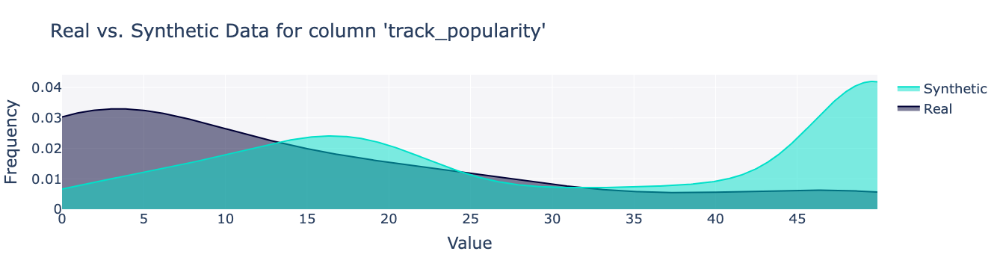

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


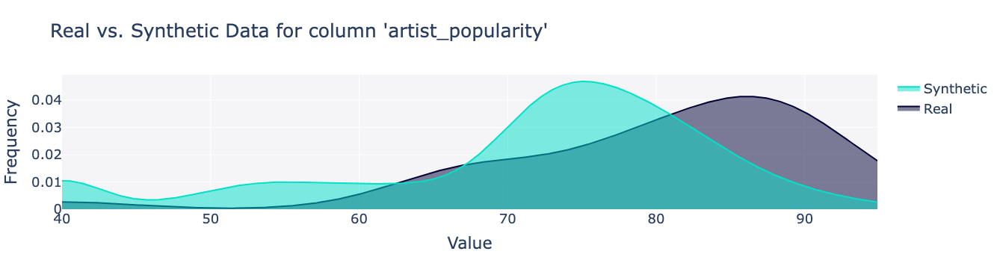

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


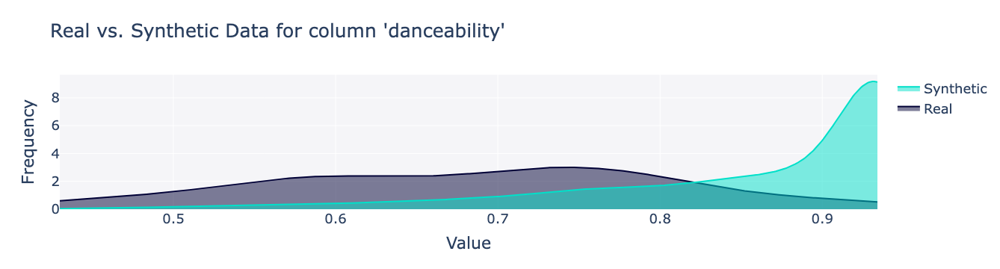

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


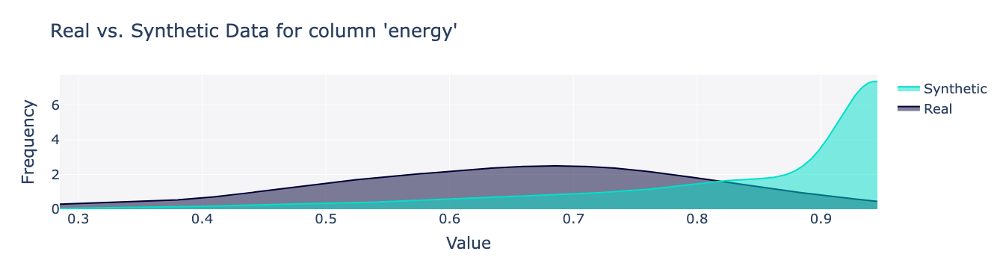

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


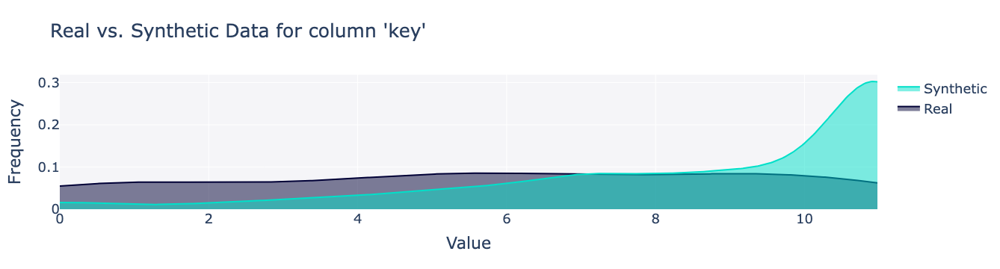

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


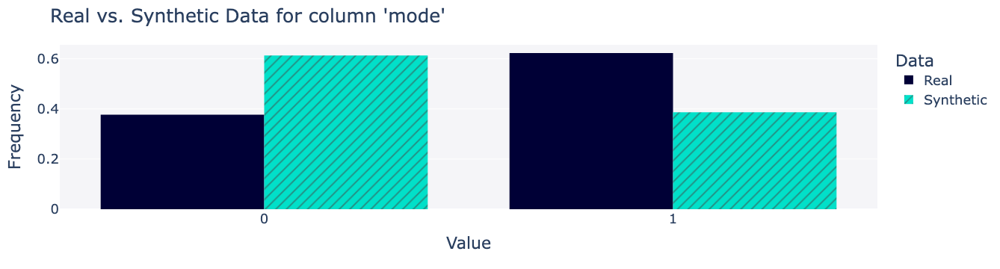

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


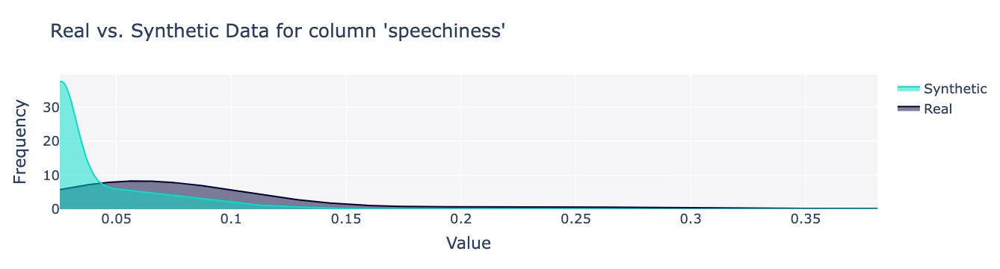

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


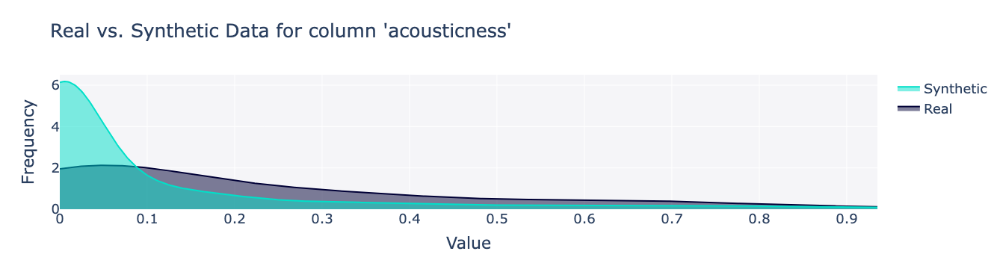

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


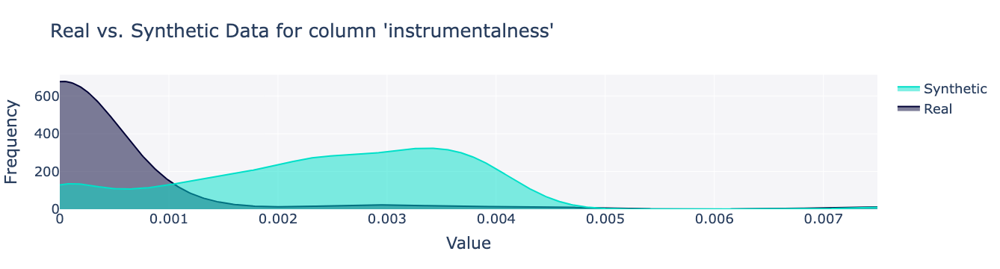

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


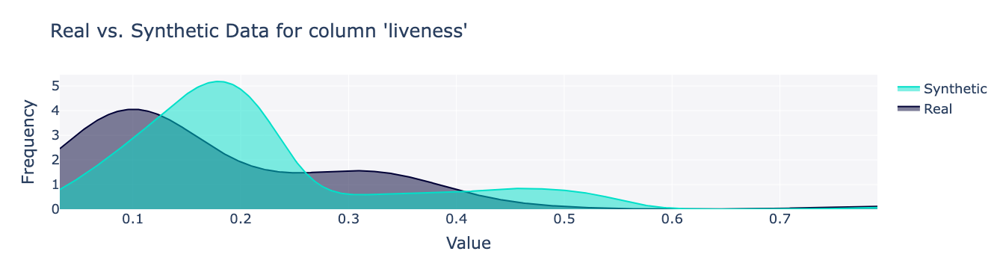

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


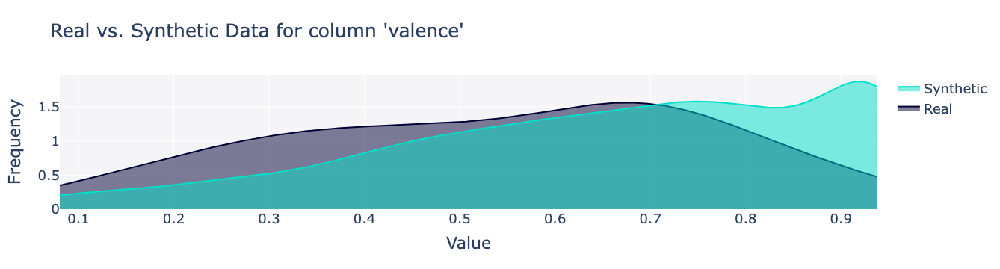

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


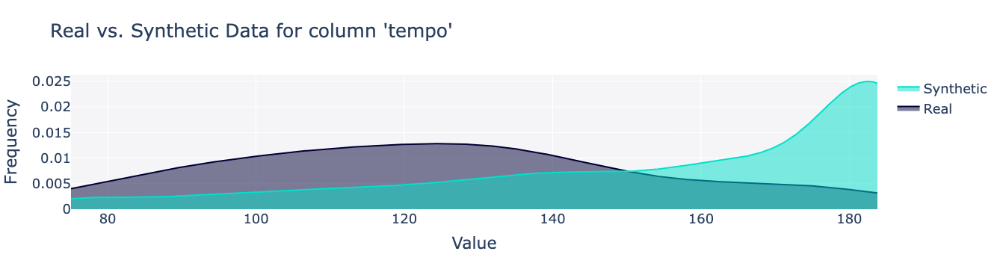

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


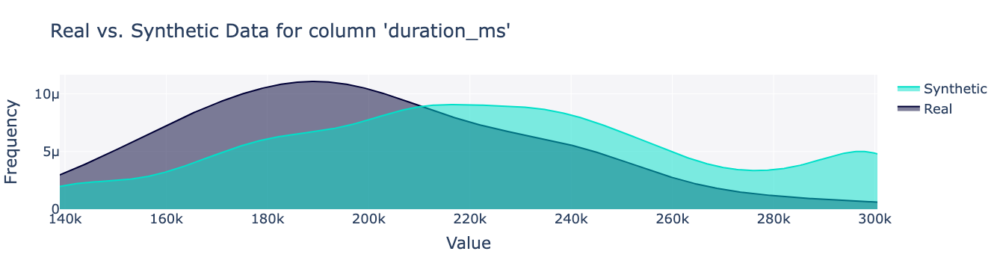

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


In [1064]:
for column_name in column_names:
    fig = plot_real_versus_synth_data(column_name ,unpopular_songs_augmented_df, CTGANSynth_data_df, metadata )
    fig.show()
    print('+' * 100)

In [1065]:
from sdv.single_table import TVAESynthesizer

# Create a synthesizer model
synthesizer_TVAESynth = TVAESynthesizer(metadata)

# Fit the synthesizer to the real data
synthesizer_TVAESynth.fit(unpopular_songs_augmented_df)

# Generate synthetic data (e.g., 1000 samples)
synthetic_data_TVAESynth = synthesizer_TVAESynth.sample(2302 - 62)

In [1066]:
# Save or use the synthetic data
synthetic_data_TVAESynth.to_csv('./synthetic_TVAESynth_data.csv', index=False)

In [1067]:
TVAESynth_data_df = pd.read_csv('synthetic_TVAESynth_data.csv')

In [1068]:
for column_name in column_names:
    fig = plot_real_versus_synth_data(column_name ,unpopular_songs_augmented_df, TVAESynth_data_df, metadata )
    fig.show()
    print('+' * 100)

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


In [1069]:
from sdv.single_table import CopulaGANSynthesizer

# Create a synthesizer model
synthesizer_CopulaGAN = CopulaGANSynthesizer(metadata)

# Fit the synthesizer to the real data
synthesizer_CopulaGAN.fit(unpopular_songs_augmented_df)

# Generate synthetic data (e.g., 1000 samples)
synthetic_CopulaGAN_data = synthesizer.sample(2302 - 62)

In [1070]:
# Save or use the synthetic data
synthetic_CopulaGAN_data.to_csv('./synthetic_CopulaGANS_data.csv', index=False)

In [1071]:
CopulaGAN_data_data_df = pd.read_csv('synthetic_CopulaGANS_data.csv')

In [1072]:
for column_name in column_names:
    fig = plot_real_versus_synth_data(column_name ,unpopular_songs_augmented_df, CopulaGAN_data_data_df, metadata )
    fig.show()
    print('+' * 100)

++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++


## Summary: Comparison of synthetic versus real data for four synthetic data synthesizers
- These synthesizers are part of the SVD (Synthetic Data Vault) python package, developed at MIT.
>> (see Patki, Wedge and Veeramachaneni, "The Synthetic Data Vault", available in the github repo)
### SVD docs describe these as:
- GaussianCopula, a  "classic, statistical methods to train a model and generate synthetic data."
>> 'Gaussian' referes to gaussian distribution and 'copula' to a type of generative function
- CTGAN, a "GAN-based, deep learning methods to train a model and generate synthetic data".
>> 'GAN' stands for 'Generative adversarial network'
- TVAE, "a variational autoencoder (VAE)-based, neural network techniques to train a model and generate synthetic data".
>> 'TVAE' stands for 'Triplet-Based Variational Autoencoder'
- CopulaGAN, "uses a mix classic, statistical methods and GAN-based deep learning methods to train a model and generate synthetic data."


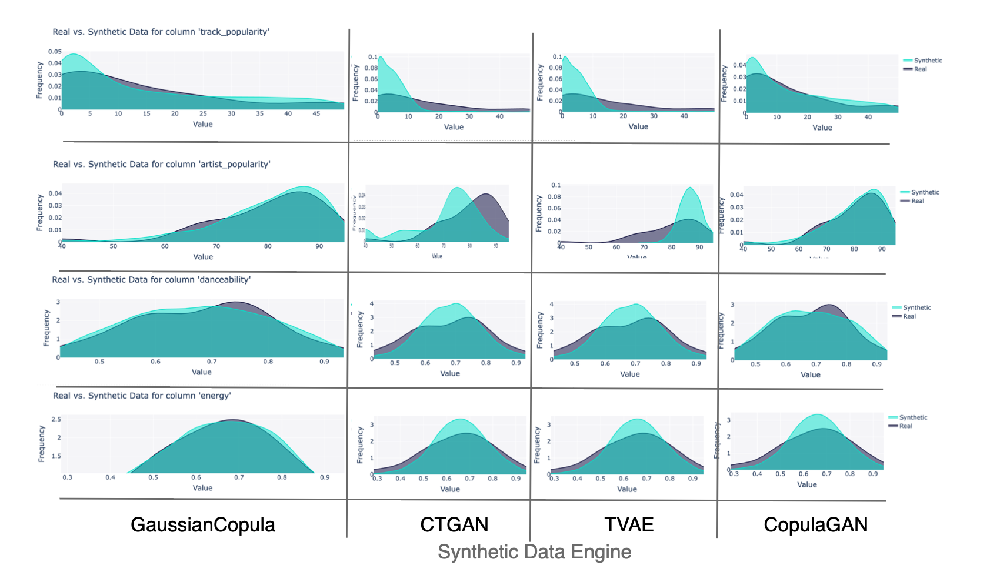

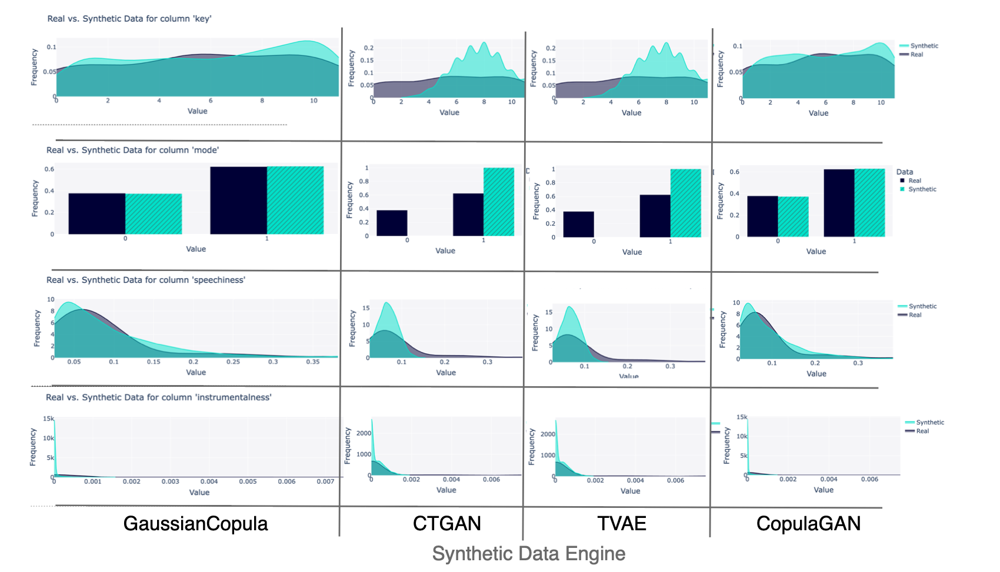

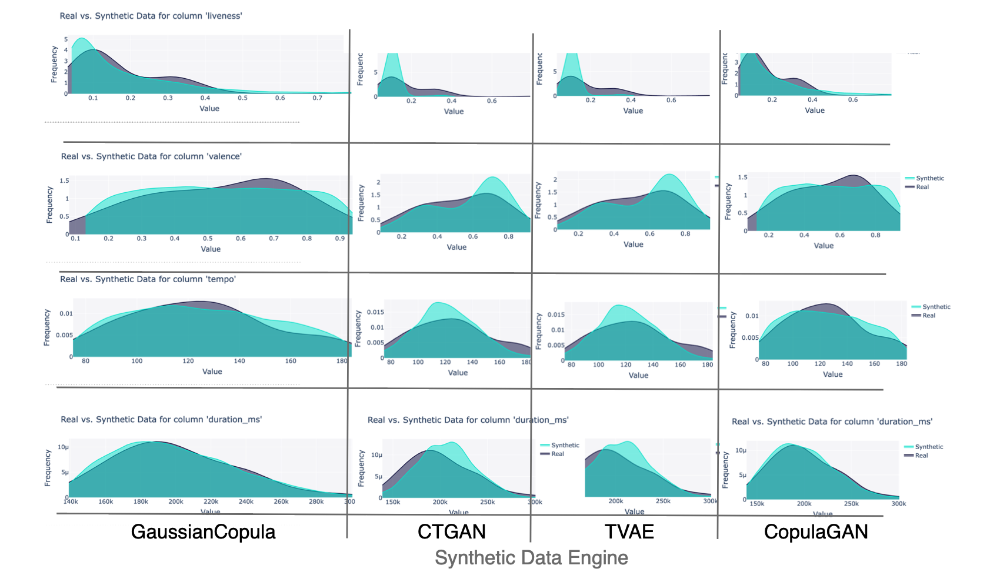